# Part 1 - Drug Efficacy Heterogeneity Study using Coefficients of PK/PD

In [1]:
#!/usr/bin/env python3
# -*- coding: utf-8 -*-
"""
Created on Fri Oct  9 11:38:48 2020

@author: harshparikh
"""
import numpy as np
import pandas as pd
import sklearn.tree as tree
import matplotlib.pyplot as plt
import seaborn as sns
import warnings
warnings.filterwarnings("ignore")

def set_ds(data,col_y,max_depth=2):
    data_prime = data.copy(deep=True)
    data_prime = data_prime[['Gender', 'Age', 'marrital',
           'Hx CVA (including TIA)', 'Hx HTN', 'Hx Sz /epilepsy',
           'Hx brain surgery', 'Hx CKD', 'Hx CAD/MI', 'Hx CHF', 'Hx DM',
           'Hx of HLD', 'Hx tobacco (including ex-smokers)',
           'Hx ETOH abuse any time in their life (just when in the hx is mentioned)',
           'Hx other substance abuse, any time in their life',
           'Hx cancer (other than CNS cancer)', 'Hx CNS cancer', 'Hx COPD/ Asthma',
           'premorbid MRS before admission  (modified ranking scale),before admission',
           'SZ at presentation,(exclude non-convulsive seizures) just if it is mentioned in MGH notes (the date is necessary, however,the date is the day of admission at MGH)',
           'hydrocephalus  (either on admission or during hospital course)   QPID',
           'iMV  (initial (on admission) mechanical ventilation)', 'systolic BP',
           'diastolic BP', 'Midline shift with any reason ( Document Date)',
           'Primary systemic dx Sepsis/Shock', 'iGCS-Total', 'iGCS = T?', 'iGCS-E',
           'iGCS-V', 'iGCS-M', 'Worst GCS in 1st 24',
           'Worst GCS Intubation status', 'iGCS actual scores',
           'neuro_dx_Seizures/status epilepticus',
           'prim_dx_Respiratory disorders',col_y]].dropna()
    Y = data_prime[col_y]
    X = data_prime[['Gender', 'Age', 'marrital',
           'Hx CVA (including TIA)', 'Hx HTN', 'Hx Sz /epilepsy',
           'Hx brain surgery', 'Hx CKD', 'Hx CAD/MI', 'Hx CHF', 'Hx DM',
           'Hx of HLD', 'Hx tobacco (including ex-smokers)',
           'Hx ETOH abuse any time in their life (just when in the hx is mentioned)',
           'Hx other substance abuse, any time in their life',
           'Hx cancer (other than CNS cancer)', 'Hx CNS cancer', 'Hx COPD/ Asthma',
           'premorbid MRS before admission  (modified ranking scale),before admission',
           'SZ at presentation,(exclude non-convulsive seizures) just if it is mentioned in MGH notes (the date is necessary, however,the date is the day of admission at MGH)',
           'hydrocephalus  (either on admission or during hospital course)   QPID',
           'iMV  (initial (on admission) mechanical ventilation)', 'systolic BP',
           'diastolic BP', 'Midline shift with any reason ( Document Date)',
           'Primary systemic dx Sepsis/Shock', 'iGCS-Total', 'iGCS = T?', 'iGCS-E',
           'iGCS-V', 'iGCS-M', 'Worst GCS in 1st 24',
           'Worst GCS Intubation status', 'iGCS actual scores',
           'neuro_dx_Seizures/status epilepticus',
           'prim_dx_Respiratory disorders']]
    model = tree.DecisionTreeRegressor(max_depth=max_depth,min_samples_split=10,min_samples_leaf=8).fit(X,Y)
    print(model.score(X,Y))
    return X,Y,model

In [3]:
data = pd.read_csv('/Users/harshparikh/Documents/GitHub/iic_causal_inference/aim1/simulator/results/params_cauchy_expit_ARMA16_iter1000.csv',index_col=0)
data.head()

,cluster,alpha0,alpha[1],theta[1],theta[2],theta[3],theta[4],theta[5],theta[6],sigma_err,...,iGCS-Total,iGCS = T?,iGCS-E,iGCS-V,iGCS-M,Worst GCS in 1st 24,Worst GCS Intubation status,iGCS actual scores,neuro_dx_Seizures/status epilepticus,prim_dx_Respiratory disorders
SID,,,,,,,,,,,,,,,,,,,,,
sid2,5,0.311404,0.243438,-0.082542,-0.016406,0.007245,0.003303,-0.001077,-0.002507,2.787910,...,7.0,0.0,1.0,2.0,4.0,3.0,1.0,3.0,0.0,1.0
sid8,5,1.211867,0.170145,-0.082542,-0.016406,0.007245,0.003303,-0.001077,-0.002507,2.787910,...,12.0,0.0,4.0,2.0,6.0,11.0,0.0,12.0,1.0,0.0
sid13,5,0.669065,0.228883,-0.082542,-0.016406,0.007245,0.003303,-0.001077,-0.002507,2.787910,...,10.0,0.0,4.0,1.0,5.0,3.0,1.0,10.0,1.0,0.0
sid17,5,-0.645282,0.381436,-0.082542,-0.016406,0.007245,0.003303,-0.001077,-0.002507,2.787910,...,8.0,0.0,1.0,2.0,5.0,8.0,0.0,8.0,0.0,0.0
sid18,4,2.849906,0.145905,-0.082542,-0.016406,0.007245,0.003303,-0.001077,-0.002507,2.583988,...,4.0,1.0,2.0,1.0,1.0,4.0,1.0,4.0,1.0,0.0


In [4]:
col_y = 'alpha0'
X,Y,model = set_ds(data,col_y,max_depth=3)

0.11900694678182511


In [4]:
X.columns

Index(['Gender', 'Age', 'marrital', 'Hx CVA (including TIA)', 'Hx HTN',
       'Hx Sz /epilepsy', 'Hx brain surgery', 'Hx CKD', 'Hx CAD/MI', 'Hx CHF',
       'Hx DM', 'Hx of HLD', 'Hx tobacco (including ex-smokers)',
       'Hx ETOH abuse any time in their life (just when in the hx is mentioned)',
       'Hx other substance abuse, any time in their life',
       'Hx cancer (other than CNS cancer)', 'Hx CNS cancer', 'Hx COPD/ Asthma',
       'premorbid MRS before admission  (modified ranking scale),before admission',
       'SZ at presentation,(exclude non-convulsive seizures) just if it is mentioned in MGH notes (the date is necessary, however,the date is the day of admission at MGH)',
       'hydrocephalus  (either on admission or during hospital course)   QPID',
       'iMV  (initial (on admission) mechanical ventilation)', 'systolic BP',
       'diastolic BP', 'Midline shift with any reason ( Document Date)',
       'Primary systemic dx Sepsis/Shock', 'iGCS-Total', 'iGCS = T?', 'iGC

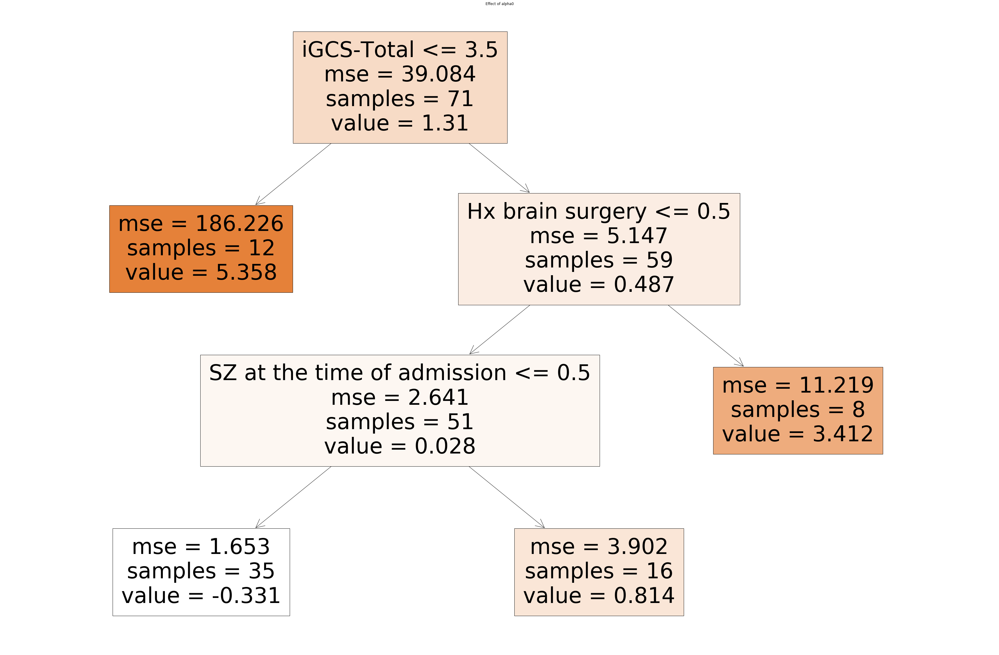

In [6]:
fig,ax = plt.subplots(figsize=(60,40))
tree.plot_tree(model,ax=ax,
               feature_names=['Gender', 'Age', 'marrital', 'Hx CVA (including TIA)', 'Hx HTN',
       'Hx Sz /epilepsy', 'Hx brain surgery', 'Hx CKD', 'Hx CAD/MI', 'Hx CHF',
       'Hx DM', 'Hx of HLD', 'Hx tobacco (including ex-smokers)',
       'Hx ETOH abuse any time in their life (just when in the hx is mentioned)',
       'Hx other substance abuse, any time in their life',
       'Hx cancer (other than CNS cancer)', 'Hx CNS cancer', 'Hx COPD/ Asthma',
       'premorbid MRS before admission  (modified ranking scale),before admission',
       'SZ at the time of admission',
       'hydrocephalus  (either on admission or during hospital course)   QPID',
       'iMV  (initial (on admission) mechanical ventilation)', 'systolic BP',
       'diastolic BP', 'Midline shift with any reason ( Document Date)',
       'Primary systemic dx Sepsis/Shock', 'iGCS-Total', 'iGCS = T?', 'iGCS-E',
       'iGCS-V', 'iGCS-M', 'Worst GCS in 1st 24',
       'Worst GCS Intubation status', 'iGCS actual scores',
       'neuro_dx_Seizures/status epilepticus',
       'prim_dx_Respiratory disorders'],filled = True)
plt.title('Effect of %s'%(col_y))
fig.savefig('importance_tree_%s.png'%(col_y))

In [50]:
X.shape

(71, 36)

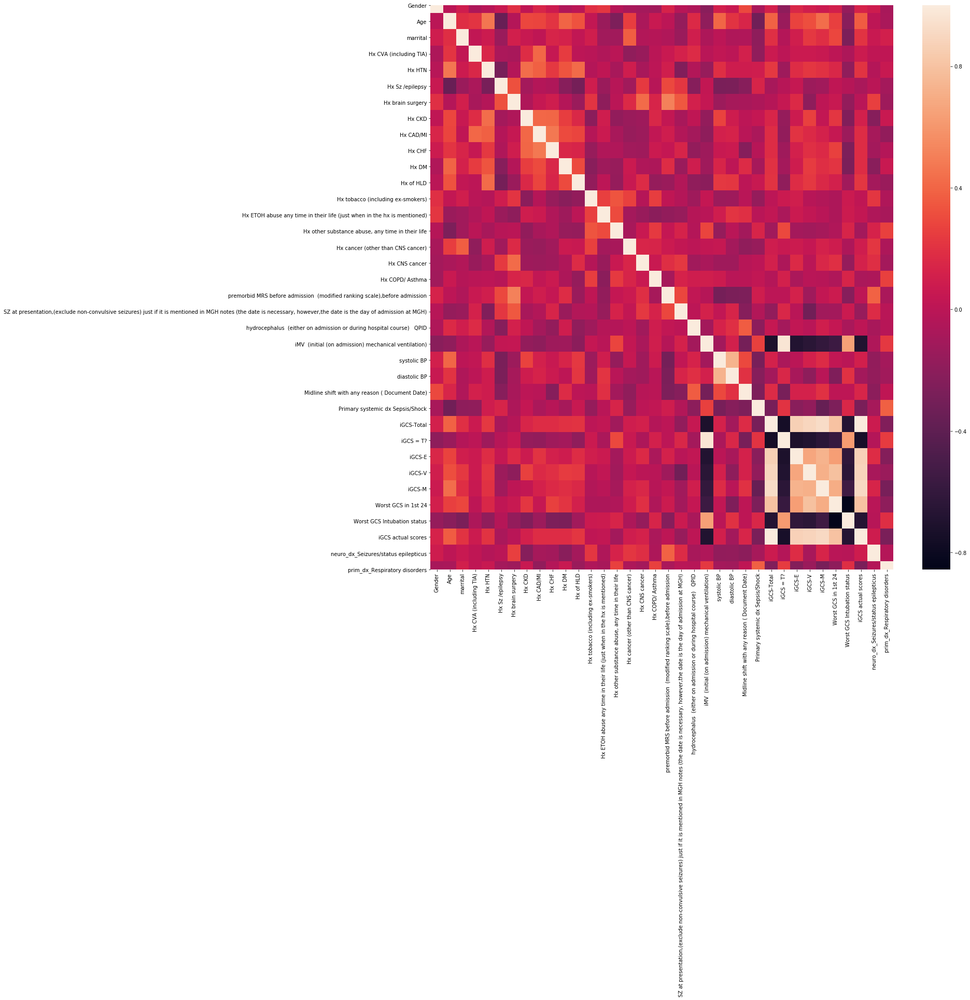

In [7]:
C_correlation = np.corrcoef(X,rowvar=False)
fig = plt.figure(figsize=(20,20))
sns.heatmap(C_correlation)
plt.xticks(np.arange(C_correlation.shape[0])+0.5,X.columns,rotation=90)
plt.yticks(np.arange(C_correlation.shape[0])+0.5,X.columns,rotation=0)
fig.savefig('correlation_c.png')

# Part 2 - Observational Study for Efficacy of Drugs

Let's start with studying the efficacy of Midazolam

### Reading Patients' Data


In [169]:
import numpy as np
import pandas as pd
import sklearn.tree as tree
import matplotlib.pyplot as plt
import seaborn as sns
import scipy
import scipy.io as sio
import tqdm
import os
import sklearn.ensemble as ensemble
import sklearn.linear_model as lm

data_dir = '/Users/harshparikh/IIC/step1_output/'

In [170]:
covariates = pd.read_csv(data_dir+'covariates.csv',index_col=0)
covariates.head()

,Gender,Age,marrital,APACHE II first 24,Hx CVA (including TIA),Hx HTN,Hx Sz /epilepsy,Hx brain surgery,Hx CKD,Hx CAD/MI,...,iGCS-Total,iGCS = T?,iGCS-E,iGCS-V,iGCS-M,Worst GCS in 1st 24,Worst GCS Intubation status,iGCS actual scores,neuro_dx_Seizures/status epilepticus,prim_dx_Respiratory disorders
Index,,,,,,,,,,,,,,,,,,,,,
sid36,0,73.84,0.0,NaN,0.0,0.0,0.0,0.0,0.0,0.0,...,9,0,4,1,4,3,1,9,0,0
sid39,0,70.77,0.0,NaN,1.0,1.0,1.0,0.0,0.0,0.0,...,9,0,4,1,4,9,0,9,1,0
sid56,1,82.84,0.0,NaN,1.0,0.0,1.0,0.0,0.0,1.0,...,12,0,4,3,5,3,1,12,1,0
sid297,0,58.95,1.0,NaN,1.0,1.0,1.0,0.0,1.0,1.0,...,15,0,4,5,6,15,0,15,0,0
sid327,0,45.47,1.0,NaN,0.0,0.0,0.0,0.0,0.0,0.0,...,7,1,1,1,5,7,1,7,1,0


In [171]:
outcomes = pd.read_csv(data_dir+'outcomes.csv',index_col=0)
outcomes.head()

,DC MRS (modified ranking scale),DC GOSE (extended glasgow outcome scale),"DC dispo home=1, rehab=2, SNF =3, hospice =4, dead =5"
Index,,,
sid36,4,3.0,2.0
sid39,4,3.0,2.0
sid56,5,3.0,2.0
sid297,3,4.0,1.0
sid327,6,1.0,5.0


In [172]:
def get_pk_k():
    halflife = pd.DataFrame({
        'lacosamide':[13],
        'levetiracetam':[6],
        'midazolam':[1.5],
        'pentobarbital':[15],
        'phenobarbital':[53],
        'phenytoin':[22],
        'propofol':[1.5],
        'valproate':[8]
        },index=['t1/2'])
    halflife = halflife.append(np.log(2) / halflife.rename(index={'t1/2':'k'}))
    PK_K = halflife.loc['k']
    return PK_K
    
def drug_concentration(d_ts,k):
    """
    d_ts.shape = (#drug, T)
    """
    k_ts = np.array([ np.exp(-k*t) for t in range(d_ts.shape[1]) ]).T
    conc = np.array([np.convolve(d_ts[i],k_ts[i],'full') for i in range(d_ts.shape[0])])
    conc = conc[:,:d_ts.shape[1]]
    return conc


# # data functions


def patient(path, W):
    window = W
    step   = W
    
    #if '.mat' in path:
    mat = sio.loadmat(path)
    human_iic = mat['human_iic'].flatten().astype(float)
    spike = mat['spike'].flatten().astype(float)
    drugs = mat['drugs_weightnormalized'].astype(float)
    artifact = mat['artifact'].flatten().astype(float)
    freq = mat['spec_freq'].flatten().astype(float)
    spec = mat['spec'].astype(float)
    human_iic[artifact==1] = np.nan
    spike[artifact==1] = np.nan

    drugnames = list(map(lambda x: x.strip(), mat['Dnames']))
    drugs_window = np.array([ np.mean(drugs[i:i+window],axis=0) for i in range(0,len(drugs),step) ])

    sz_burden = (human_iic==1).astype(float)
    sz_burden[np.isnan(human_iic)] = np.nan
    sz_burden_window = np.array([np.nanmean(sz_burden[i:i+window]) for i in range(0, len(sz_burden),step)])

    iic_burden = np.in1d(human_iic, [1,2,3,4]).astype(float)
    iic_burden[np.isnan(human_iic)] = np.nan
    iic_burden_window = np.array([np.nanmean(iic_burden[i:i+window]) for i in range(0, len(iic_burden),step)])

    spike_rate_window = np.array([np.nanmean(spike[i:i+window]) for i in range(0, len(spike),step)])

    spec_window = np.array([np.nanmean(spec[i:i+window], axis=0) for i in range(0, len(spec),step)])
    
    res = {'sz_burden': sz_burden_window,
           'iic_burden': iic_burden_window,
           'spike_rate': spike_rate_window,
           'spec': spec_window,
           'freq': freq}
    for i, dn in enumerate(drugnames):
        res[dn] = drugs_window[:,i]
    return res


# In[6]:


def preprocess(sid, data_dir, PK_K, W, drugs_tostudy):  # previsously called patient_data

    #fetch the data
    p = patient(os.path.join(data_dir, sid + '.mat'), W)

    #setting up the data
    response_tostudy = 'iic_burden'
    Pobs = p[response_tostudy]

    #PK
    Ddose = np.array([p[x] for x in drugs_tostudy])
    D = drug_concentration(Ddose, PK_K[drugs_tostudy].values).T

    #cov_tostudy = ['Age']
    C = pd.read_csv(os.path.join(data_dir, 'covariates.csv'))
    Cname = list(C.columns)
    C = C[C.Index==sid].iloc[0]#[cov_tostudy]
    
    return Pobs, response_tostudy, D, drugs_tostudy, C, Cname, p['spec'], p['freq']


In [173]:
patients = {}

sids = ['sid2', 'sid8', 'sid13', 'sid17', 'sid18', 'sid30', 'sid36', 'sid39', 'sid54',
        'sid56', 'sid69', 'sid77', 'sid82', 'sid88', 'sid91', 'sid92', 'sid297', 'sid327',
        'sid385', 'sid395', 'sid400', 'sid403', 'sid406', 'sid424', 'sid450', 'sid456',
        'sid490', 'sid512', 'sid551', 'sid557', 'sid734', 'sid736', 'sid801', 'sid821',
        'sid824', 'sid827', 'sid832', 'sid833', 'sid834', 'sid839', 'sid848', 'sid849',
        'sid852', 'sid872', 'sid876', 'sid880', 'sid881', 'sid884', 'sid886',
        'sid915', 'sid940', 'sid942', 'sid944', 'sid952', 'sid960', 'sid965', 'sid967',
        'sid983', 'sid987', 'sid988', 'sid994', 'sid1002', 'sid1006', 'sid1016', 'sid1022',
        'sid1025', 'sid1034', 'sid1038', 'sid1039', 'sid1055', 'sid1056', 'sid1063', 'sid1113',
        'sid1116', 'sid1337', 'sid1913', 'sid1915', 'sid1916', 'sid1917', 'sid1928', 'sid1956', 'sid1966']

drugs_tostudy = ['lacosamide', 'levetiracetam', 'midazolam','propofol', 'valproate']
    
PK_K = get_pk_k()

W = 300
Pobs = {}
D = {}
# spec = []
# freq = []
for sid in tqdm.tqdm(sids):
    Pobs_, Pname, D_, Dname, C_, Cname, spec_, freq_ = preprocess(sid, data_dir, PK_K, W, drugs_tostudy)
    Pobs_ = pd.DataFrame(Pobs_.reshape(-1,1),columns=[Pname])
    D_ = pd.DataFrame(D_,columns=Dname)
    Pobs[sid] = Pobs_
    D[sid] = D_

100%|██████████| 82/82 [00:22<00:00,  3.69it/s]


In [174]:
covariates.loc[sids].head()

,Gender,Age,marrital,APACHE II first 24,Hx CVA (including TIA),Hx HTN,Hx Sz /epilepsy,Hx brain surgery,Hx CKD,Hx CAD/MI,...,iGCS-Total,iGCS = T?,iGCS-E,iGCS-V,iGCS-M,Worst GCS in 1st 24,Worst GCS Intubation status,iGCS actual scores,neuro_dx_Seizures/status epilepticus,prim_dx_Respiratory disorders
Index,,,,,,,,,,,,,,,,,,,,,
sid2,0,85.01,0.0,NaN,0.0,1.0,0.0,0.0,1.0,0.0,...,7,0,1,2,4,3,1,3,0,1
sid8,0,67.24,0.0,NaN,0.0,1.0,0.0,0.0,0.0,0.0,...,12,0,4,2,6,11,0,12,1,0
sid13,0,48.12,0.0,NaN,0.0,0.0,0.0,0.0,0.0,0.0,...,10,0,4,1,5,3,1,10,1,0
sid17,0,35.03,0.0,NaN,0.0,0.0,1.0,0.0,0.0,0.0,...,8,0,1,2,5,8,0,8,0,0
sid18,1,60.20,0.0,NaN,0.0,1.0,1.0,1.0,0.0,0.0,...,4,1,2,1,1,4,1,4,1,0


In [175]:
outcomes.loc[sids].head()

,DC MRS (modified ranking scale),DC GOSE (extended glasgow outcome scale),"DC dispo home=1, rehab=2, SNF =3, hospice =4, dead =5"
Index,,,
sid2,5,2.0,4.0
sid8,4,4.0,2.0
sid13,5,2.0,2.0
sid17,6,1.0,5.0
sid18,5,2.0,2.0


In [176]:
def intervention_information(Pobs,D,sids,f=6):
    Pobs_pre, intervention, outcome, time_of_int = {}, {}, {}, {}
    for sid in sids:
        t = np.min(D[sid].loc[D[sid].sum(axis=1) > 0].index)
        Pobs_pre[sid] = Pobs[sid].loc[:t]['iic_burden']
        intervention[sid] = D[sid].loc[t]
        outcome[sid] = Pobs[sid].loc[t:t+f]['iic_burden'].to_numpy()
        time_of_int[sid] = t
    return pd.DataFrame.from_dict(Pobs_pre,orient='index'), pd.DataFrame.from_dict(intervention,orient='index'), pd.DataFrame.from_dict(outcome,orient='index'), pd.DataFrame.from_dict(time_of_int,orient='index')

In [177]:
f=12
Pobs_pre, intervention, short_term_outcome, time_of_int = intervention_information(Pobs,D,sids,f)

In [178]:
distance = lambda x,y: np.linalg.norm(x-y)
def neighbors(x,S,k=1):
    d_array = list( map( lambda y: distance(x,y), S.to_numpy() ) )
    kneighbor = S.index[np.argpartition(d_array, k)[:k]]
    return kneighbor

In [179]:
Sc = Pobs_pre.loc[intervention['midazolam']==0].max(axis=1)
St = Pobs_pre.loc[intervention['midazolam']>0].max(axis=1)

  9%|▊         | 7/82 [00:01<00:16,  4.57it/s]

sid30


100%|██████████| 82/82 [00:05<00:00, 15.47it/s]


(-1, 1)

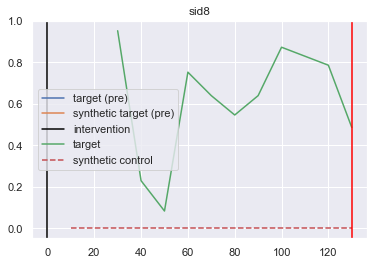

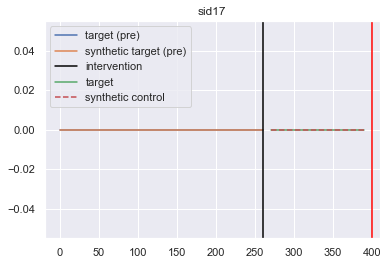

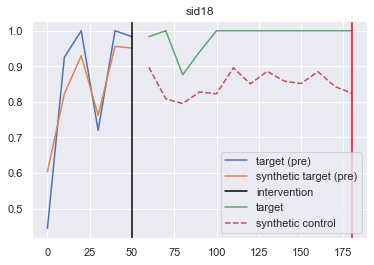

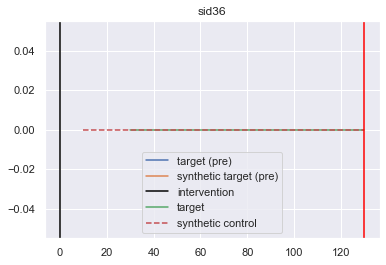

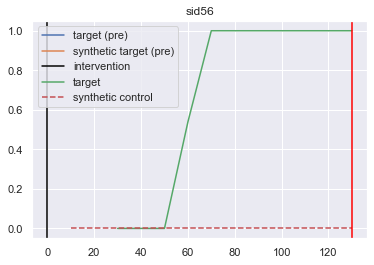

...

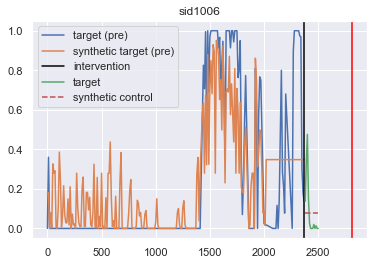

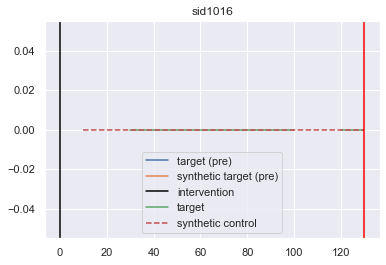

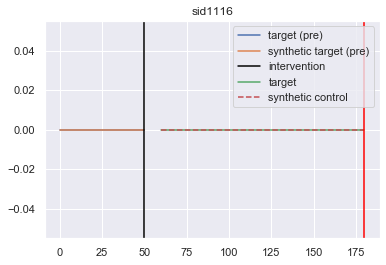

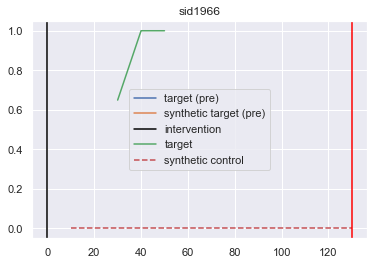

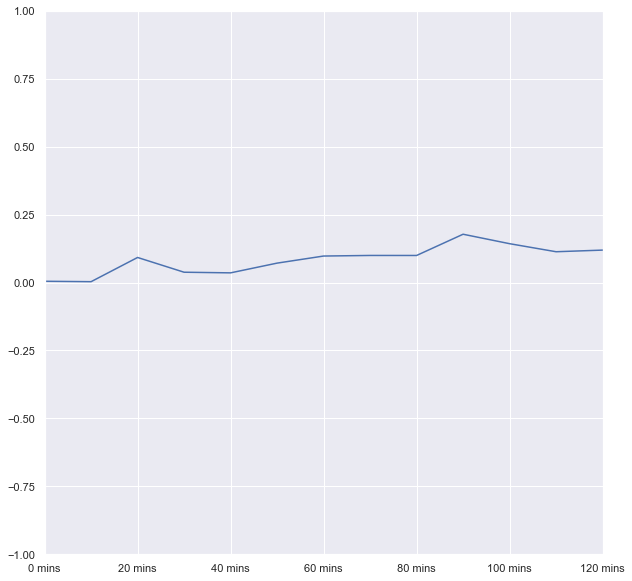

In [182]:
#Synthetic Control
T = intervention['propofol']>0
TE_propofol = []
import sklearn.ensemble as ensemble
for sid in tqdm.tqdm(sids):
    t = T.loc[sid]
    if t:
        x = Pobs_pre.loc[sid,:time_of_int[0].loc[sid]].interpolate(method='linear', limit_direction='forward', axis=0).fillna(method='bfill').fillna(0)
        y1 = short_term_outcome.loc[sid]
        x0 = Pobs_pre.loc[time_of_int[0]>time_of_int[0].loc[sid]+f,0:time_of_int[0].loc[sid]].T
        x0 = x0.interpolate(method='linear', limit_direction='forward', axis=0).fillna(method='bfill').fillna(0)
        try:
#             model = lm.Ridge().fit(x0,x) x = \sum_j w_j x0_j 
            model = ensemble.RandomForestRegressor().fit(x0,x)
            fig=plt.figure()
            plt.title(sid)
            plt.plot(10*np.arange(0,len(x)),x)
            plt.plot(10*np.arange(0,len(x)),model.predict(x0))
#             plt.plot(np.arange(0,len(x)),np.mean(x0,axis=1))
            plt.axvline(10*time_of_int[0].loc[sid],c='black')
            y0 = Pobs_pre.loc[time_of_int[0]>time_of_int[0].loc[sid]+f,time_of_int[0].loc[sid]:time_of_int[0].loc[sid]+f].T
            y0 = y0.interpolate(method='linear', limit_direction='forward', axis=0).fillna(method='bfill').fillna(0)
            y0_predict = model.predict(y0)
            plt.plot(10*np.arange(len(x),len(x)+len(y1)),y1)
            plt.plot(10*np.arange(len(x),len(x)+len(y1)),model.predict(y0),'--')
#             plt.plot(np.arange(len(x),len(x)+len(y1)),np.mean(y0,axis=1),'*')
            plt.axvline(10*np.min(time_of_int.loc[time_of_int[0]>time_of_int[0].loc[sid]+f,0]),c='red')
            plt.legend(['target (pre)','synthetic target (pre)','intervention','target','synthetic control'])
            TE_propofol.append(y1-y0_predict)
        except:
            print(sid)
TE_propofol_df = pd.DataFrame(TE_propofol).rename(columns={i:'%d mins'%(10*i) for i in range(f+1)})
fig=plt.figure(figsize=(10,10))
TE_propofol_df.mean(axis=0).plot()
plt.ylim((-1,1))

100%|██████████| 82/82 [00:00<00:00, 106.31it/s]


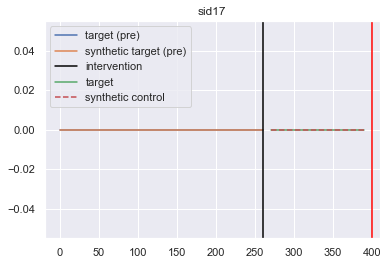

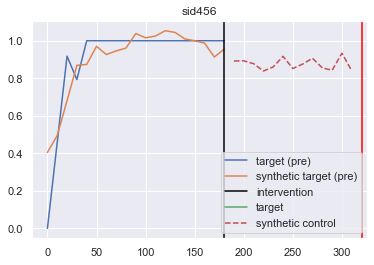

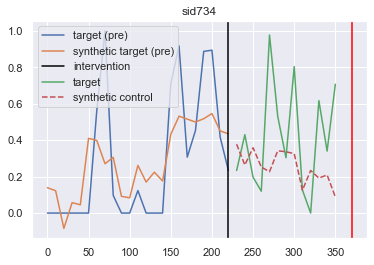

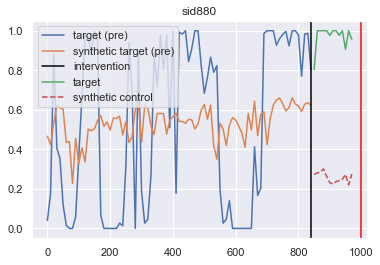

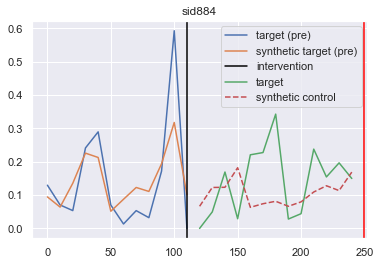

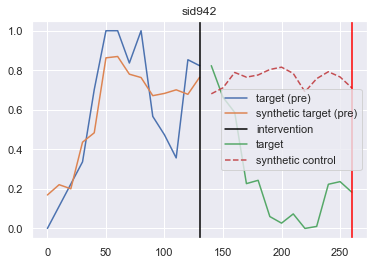

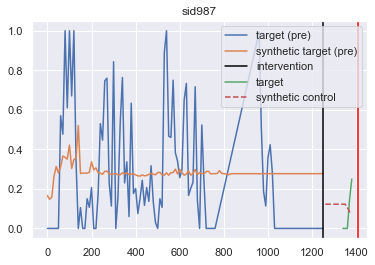

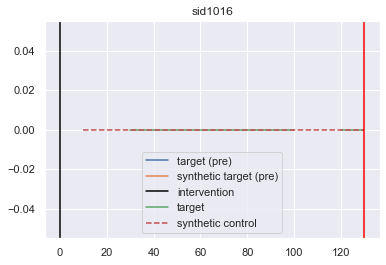

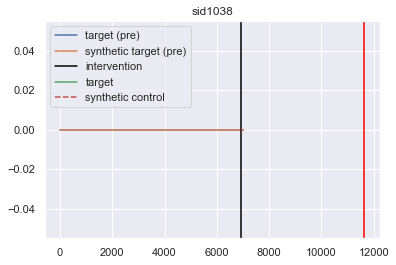

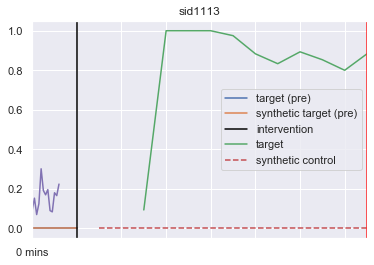

In [14]:
#Synthetic Control
sns.set()
T = intervention['midazolam']>0
TE_midazolam = []
import sklearn.ensemble as ensemble
for sid in tqdm.tqdm(sids[:]):
    t = T.loc[sid]
    if t:
        x = Pobs_pre.loc[sid,:time_of_int[0].loc[sid]].interpolate(method='linear', limit_direction='forward', axis=0).fillna(method='bfill').fillna(0)
        y1 = short_term_outcome.loc[sid]
        x0 = Pobs_pre.loc[time_of_int[0]>time_of_int[0].loc[sid]+f,0:time_of_int[0].loc[sid]].T 
        #for a control unit, the time of first intervention has to be after (f+time of first intervention for unit i)
        x0 = x0.interpolate(method='linear', limit_direction='forward', axis=0).fillna(method='bfill').fillna(0)
        try:
#             model = ensemble.AdaBoostRegressor().fit(x0,x)
            model = lm.Ridge().fit(x0,x) # x = \sum_j w_j x0_j --> I found this w_j
#             model = ensemble.RandomForestRegressor().fit(x0,x)
            fig=plt.figure()
            plt.title(sid)
            plt.plot(10*np.arange(0,len(x)),x)
            plt.plot(10*np.arange(0,len(x)),model.predict(x0))
#             plt.plot(np.arange(0,len(x)),np.mean(x0,axis=1))
            plt.axvline(10*time_of_int[0].loc[sid],c='black')
            y0 = Pobs_pre.loc[time_of_int[0]>time_of_int[0].loc[sid]+f,time_of_int[0].loc[sid]:time_of_int[0].loc[sid]+f].T
            y0 = y0.interpolate(method='linear', limit_direction='forward', axis=0).fillna(method='bfill').fillna(0)
            y0_predict = model.predict(y0) #syn_y0 = \sum_j w_j y0_j
            plt.plot(10*np.arange(len(x),len(x)+len(y1)),y1)
            plt.plot(10*np.arange(len(x),len(x)+len(y1)),model.predict(y0),'--')
#             plt.plot(np.arange(len(x),len(x)+len(y1)),np.mean(y0,axis=1),'*')
            plt.axvline(10*np.min(time_of_int.loc[time_of_int[0]>time_of_int[0].loc[sid]+f,0]),c='red')
            plt.legend(['target (pre)','synthetic target (pre)','intervention','target','synthetic control'])
            TE_midazolam.append(y1-y0_predict)
            
        except:
            print(sid)
TE_midazolam_df = pd.DataFrame(TE_midazolam).rename(columns={i:'%d mins'%(10*i) for i in range(f+1)})
TE_midazolam_df.mean(axis=0).plot()

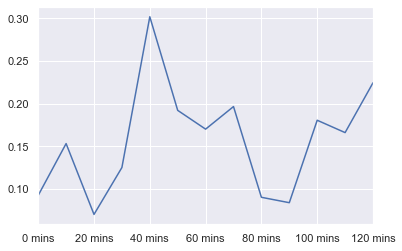

In [15]:
TE_midazolam_df.mean(axis=0).plot() #average(y1 - y0) : negative means drug is working as expected, positive is weird

100%|██████████| 82/82 [00:01<00:00, 60.10it/s]


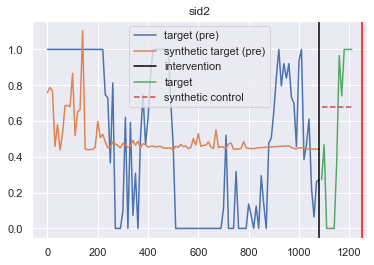

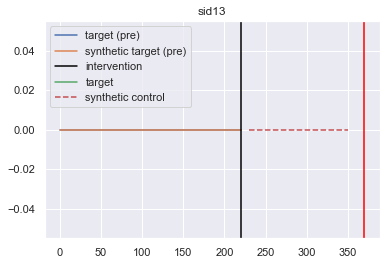

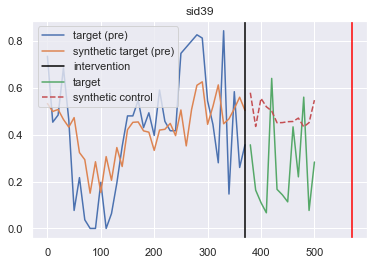

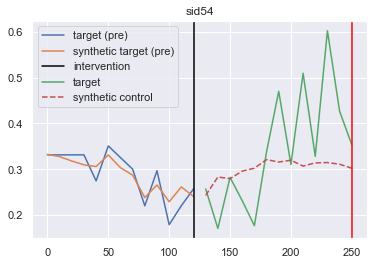

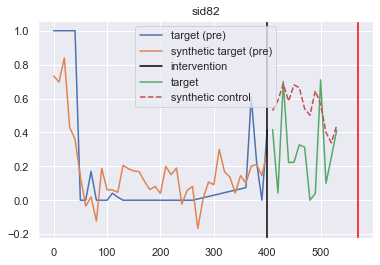

...

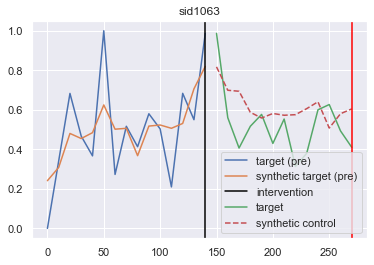

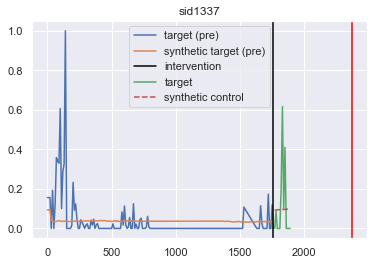

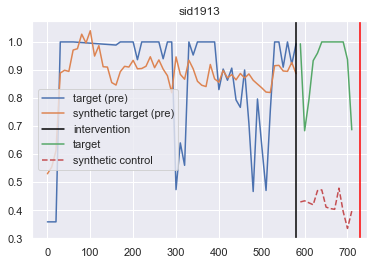

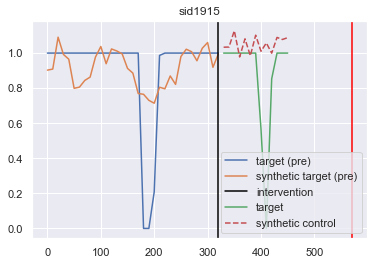

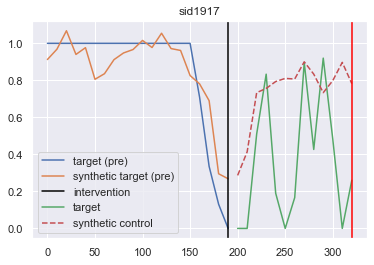

In [480]:
#Synthetic Control
T = intervention['levetiracetam']>0
TE_lev = []
import sklearn.ensemble as ensemble
for sid in tqdm.tqdm(sids):
    t = T.loc[sid]
    if t:
        x = Pobs_pre.loc[sid,:time_of_int[0].loc[sid]].interpolate(method='linear', limit_direction='forward', axis=0).fillna(method='bfill').fillna(0)
        y1 = short_term_outcome.loc[sid]
        x0 = Pobs_pre.loc[time_of_int[0]>time_of_int[0].loc[sid]+f,0:time_of_int[0].loc[sid]].T
        x0 = x0.interpolate(method='linear', limit_direction='forward', axis=0).fillna(method='bfill').fillna(0)
        try:
            model = lm.Ridge().fit(x0,x)
#             model = ensemble.ExtraTreesRegressor().fit(x0,x)
            fig=plt.figure()
            plt.title(sid)
            plt.plot(10*np.arange(0,len(x)),x)
            plt.plot(10*np.arange(0,len(x)),model.predict(x0))
#             plt.plot(np.arange(0,len(x)),np.mean(x0,axis=1))
            plt.axvline(10*time_of_int[0].loc[sid],c='black')
            y0 = Pobs_pre.loc[time_of_int[0]>time_of_int[0].loc[sid]+f,time_of_int[0].loc[sid]:time_of_int[0].loc[sid]+f].T
            y0 = y0.interpolate(method='linear', limit_direction='forward', axis=0).fillna(method='bfill').fillna(0)
            y0_predict = model.predict(y0)
            plt.plot(10*np.arange(len(x),len(x)+len(y1)),y1)
            plt.plot(10*np.arange(len(x),len(x)+len(y1)),model.predict(y0),'--')
#             plt.plot(np.arange(len(x),len(x)+len(y1)),np.mean(y0,axis=1),'*')
            plt.axvline(10*np.min(time_of_int.loc[time_of_int[0]>time_of_int[0].loc[sid]+f,0]),c='red')
            plt.legend(['target (pre)','synthetic target (pre)','intervention','target','synthetic control'])
            TE_lev.append(y1-y0_predict)
        except:
            print(sid)
TE_lev_df = pd.DataFrame(TE_lev).rename(columns={i:'%d mins'%(10*i) for i in range(f+1)})
# TE_lev_df.mean(axis=0).plot()

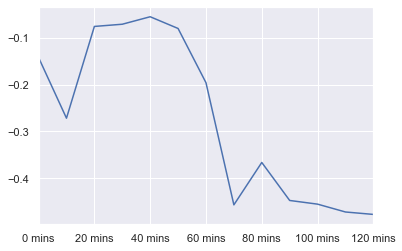

In [481]:
#Matching
epsilon = 0.0001
TE_midazolam = []
for sid in sids:
    x = Pobs_pre.loc[sid]
    t = T.loc[sid]
    if t:
        y1 = short_term_outcome.loc[sid]
        kneighbor = neighbors(x,Sc)
        y0 = short_term_outcome.loc[kneighbor].mean(axis=0)
    else:
        y0 = short_term_outcome.loc[sid]
        kneighbor = neighbors(x,St)
        y1 = short_term_outcome.loc[kneighbor].mean(axis=0)
    TE_midazolam.append((y1-y0))
TE_midazolam_df = pd.DataFrame(TE_midazolam).rename(columns={i:'%d mins'%(10*i) for i in range(f+1)})
TE_midazolam_df.mean(axis=0).plot()
# TE_midazolam_df.plot()

In [374]:
x0 = Pobs_pre.loc[time_of_int[0]>time_of_int[0].loc['sid30']+f,0:time_of_int[0].loc['sid30']].T

In [376]:
time_of_int.loc['sid30']

0    1239
Name: sid30, dtype: int64

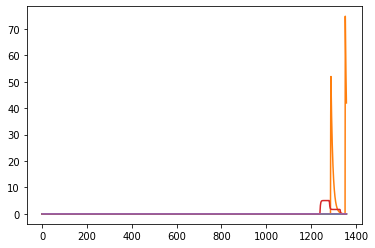

In [385]:
plt.plot(D['sid30'])

# Part-3 Matching on System Dynamics for short-term drug effect estimation

In [240]:
import numpy as np
import pandas as pd
import sklearn.tree as tree
import matplotlib.pyplot as plt
import seaborn as sns
import warnings
import numpy as np
import pandas as pd
import sklearn.tree as tree
import matplotlib.pyplot as plt
import seaborn as sns
import scipy
import scipy.io as sio
import tqdm
import os
import sklearn.ensemble as ensemble
import sklearn.linear_model as lm

data_dir = '/Users/harshparikh/IIC/step1_output/'
warnings.filterwarnings("ignore")

In [242]:
#data = pd.read_csv('/Users/harshparikh/Documents/GitHub/iic_causal_inference/aim1/step6_simulator/results_iic_burden/params_mean_CNNIIC_cauchy_expit_lognormal_drugoutside_ARMA2,6_iter1000.csv',index_col=0)
data = pd.read_csv('/home/kentaro/github/iic_causal_inference/aim1/step6_simulator/results_iic_burden_smooth/params_mean_CNNIIC_iic_burden_smooth_cauchy_expit_lognormal_drugoutside_ARMA2,6_iter1000.csv')
data = data.fillna(-999)
print(data.columns)
data = data.drop(columns=['cluster', 'alpha[2]', 'theta[1]', 'theta[2]',
       'theta[3]', 'theta[4]', 'theta[5]', 'theta[6]', 'sigma_err',
       'b[lacosamide]', 'b[levetiracetam]', 'b[midazolam]', 'b[pentobarbital]',
       'b[phenobarbital]', 'b[propofol]', 'b[valproate]', 'Gender',
       'marrital', 'APACHE II  first 24', 
       'premorbid MRS before admission  (modified ranking scale),before admission',
       'SZ at presentation,(exclude non-convulsive seizures) just if it is mentioned in MGH notes (the date is necessary, however,the date is the day of admission at MGH)',
       'hydrocephalus  (either on admission or during hospital course)   QPID',
       'iMV  (initial (on admission) mechanical ventilation)', 'systolic BP',
       'diastolic BP', 'Midline shift with any reason ( Document Date)',
       'Primary systemic dx Sepsis/Shock', 'iGCS = T?', 'iGCS-E',
       'iGCS-V', 'iGCS-M', 'Worst GCS in 1st 24',
       'Worst GCS Intubation status', 'iGCS actual scores',
       'neuro_dx_Seizures/status epilepticus'])
data_1 = data.copy(deep=True)

Index(['SID', 'cluster', 'alpha0', 'alpha[1]', 'alpha[2]', 'theta[1]',
       'theta[2]', 'theta[3]', 'theta[4]', 'theta[5]', 'theta[6]', 'sigma_err',
       'b[lacosamide]', 'b[levetiracetam]', 'b[midazolam]', 'b[pentobarbital]',
       'b[phenobarbital]', 'b[propofol]', 'b[valproate]', 'Gender', 'Age',
       'marrital', 'APACHE II  first 24', 'Hx CVA (including TIA)', 'Hx HTN',
       'Hx Sz /epilepsy', 'Hx brain surgery', 'Hx CKD', 'Hx CAD/MI', 'Hx CHF',
       'Hx DM', 'Hx of HLD', 'Hx tobacco (including ex-smokers)',
       'Hx ETOH abuse any time in their life (just when in the hx is mentioned)',
       'Hx other substance abuse, any time in their life',
       'Hx cancer (other than CNS cancer)', 'Hx CNS cancer', 'Hx COPD/ Asthma',
       'premorbid MRS before admission  (modified ranking scale),before admission',
       'SZ at presentation,(exclude non-convulsive seizures) just if it is mentioned in MGH notes (the date is necessary, however,the date is the day of admission at 

In [247]:
data = data[['alpha0', 'alpha[1]',
#              'b[lacosamide]', 'b[levetiracetam]', 
#              'b[midazolam]', 'b[pentobarbital]','b[phenobarbital]','b[propofol]', 'b[valproate]',
             'Age','iGCS-Total']]

In [248]:
#outcomes = pd.read_csv(data_dir+'outcomes.csv',index_col=0)
outcomes = pd.read_csv('/home/kentaro/Dropbox/outcomes.csv', index_col = 0)
#outcomes = outcomes.loc[data.index]
outcomes.head()

,DC MRS (modified ranking scale),DC GOSE (extended glasgow outcome scale),"DC dispo home=1, rehab=2, SNF =3, hospice =4, dead =5"
Index,,,
sid1,3,5,1.0
sid2,5,2,4.0
sid3,6,1,5.0
sid4,6,1,5.0
sid5,2,6,1.0


In [250]:
#covariates = pd.read_csv(data_dir+'covariates.csv',index_col=0)
covariates = pd.read_csv('/home/kentaro/Dropbox/covariates.csv')
covariates = covariates.loc[data.index]
covariates.head()

,Index,Gender,Age,marrital,APACHE II first 24,Hx CVA (including TIA),Hx HTN,Hx Sz /epilepsy,Hx brain surgery,Hx CKD,...,iGCS-Total,iGCS = T?,iGCS-E,iGCS-V,iGCS-M,Worst GCS in 1st 24,Worst GCS Intubation status,iGCS actual scores,neuro_dx_Seizures/status epilepticus,prim_dx_Respiratory disorders
0,sid1,0,19.93,0.0,NaN,0.0,0.0,0.0,0.0,0.0,...,11,0,4,1,6,11,0,11,0,0
1,sid2,0,85.01,0.0,NaN,0.0,1.0,0.0,0.0,1.0,...,7,0,1,2,4,3,1,3,0,1
2,sid3,1,45.91,1.0,NaN,0.0,0.0,1.0,0.0,0.0,...,8,0,3,1,4,8,0,8,0,1
3,sid4,1,53.99,1.0,NaN,0.0,0.0,0.0,1.0,0.0,...,4,0,1,2,1,3,1,4,0,1
4,sid5,1,23.08,0.0,NaN,0.0,0.0,1.0,0.0,0.0,...,6,1,1,1,4,3,1,6,1,0


In [251]:
def get_pk_k():
    halflife = pd.DataFrame({
        'lacosamide':[13],
        'levetiracetam':[6],
        'midazolam':[1.5],
        'pentobarbital':[15],
        'phenobarbital':[53],
        'phenytoin':[22],
        'propofol':[1.5],
        'valproate':[8]
        },index=['t1/2'])
    halflife = halflife.append(np.log(2) / halflife.rename(index={'t1/2':'k'}))
    PK_K = halflife.loc['k']
    return PK_K
    
def drug_concentration(d_ts,k):
    """
    d_ts.shape = (#drug, T)
    """
    k_ts = np.array([ np.exp(-k*t) for t in range(d_ts.shape[1]) ]).T
    conc = np.array([np.convolve(d_ts[i],k_ts[i],'full') for i in range(d_ts.shape[0])])
    conc = conc[:,:d_ts.shape[1]]
    return conc


# # data functions


def patient(path, W):
    window = W
    step   = W
    
    #if '.mat' in path:
    mat = sio.loadmat(path)
    human_iic = mat['human_iic'].flatten().astype(float)
    spike = mat['spike'].flatten().astype(float)
    drugs = mat['drugs_weightnormalized'].astype(float)
    artifact = mat['artifact'].flatten().astype(float)
    freq = mat['spec_freq'].flatten().astype(float)
    spec = mat['spec'].astype(float)
    human_iic[artifact==1] = np.nan
    spike[artifact==1] = np.nan

    drugnames = list(map(lambda x: x.strip(), mat['Dnames']))
    drugs_window = np.array([ np.mean(drugs[i:i+window],axis=0) for i in range(0,len(drugs),step) ])

    sz_burden = (human_iic==1).astype(float)
    sz_burden[np.isnan(human_iic)] = np.nan
    sz_burden_window = np.array([np.nanmean(sz_burden[i:i+window]) for i in range(0, len(sz_burden),step)])

    iic_burden = np.in1d(human_iic, [1,2,3,4]).astype(float)
    iic_burden[np.isnan(human_iic)] = np.nan
    iic_burden_window = np.array([np.nanmean(iic_burden[i:i+window]) for i in range(0, len(iic_burden),step)])

    spike_rate_window = np.array([np.nanmean(spike[i:i+window]) for i in range(0, len(spike),step)])

    spec_window = np.array([np.nanmean(spec[i:i+window], axis=0) for i in range(0, len(spec),step)])
    
    res = {'sz_burden': sz_burden_window,
           'iic_burden': iic_burden_window,
           'spike_rate': spike_rate_window,
           'spec': spec_window,
           'freq': freq}
    for i, dn in enumerate(drugnames):
        res[dn] = drugs_window[:,i]
    return res


# In[6]:


def preprocess(sid, data_dir, PK_K, W, drugs_tostudy):  # previsously called patient_data

    #fetch the data
    p = patient(os.path.join(data_dir, sid + '.mat'), W)

    #setting up the data
    response_tostudy = 'iic_burden'
    Pobs = p[response_tostudy]

    #PK
    Ddose = np.array([p[x] for x in drugs_tostudy])
    D = drug_concentration(Ddose, PK_K[drugs_tostudy].values).T

    #cov_tostudy = ['Age']
    C = pd.read_csv(os.path.join(data_dir, 'covariates.csv'))
    Cname = list(C.columns)
    C = C[C.Index==sid].iloc[0]#[cov_tostudy]
    
    return Pobs, response_tostudy, D, drugs_tostudy, C, Cname, p['spec'], p['freq']


In [252]:
patients = {}

sids = ['sid2', 'sid8', 'sid13', 'sid17', 'sid18', 'sid30', 'sid36', 'sid39', 'sid54',
        'sid56', 'sid69', 'sid77', 'sid82', 'sid88', 'sid91', 'sid92', 'sid297', 'sid327',
        'sid385', 'sid395', 'sid400', 'sid403', 'sid406', 'sid424', 'sid450', 'sid456',
        'sid490', 'sid512', 'sid551', 'sid557', 'sid734', 'sid736', 'sid801', 'sid821',
        'sid824', 'sid827', 'sid832', 'sid833', 'sid834', 'sid839', 'sid848', 'sid849',
        'sid852', 'sid872', 'sid876', 'sid880', 'sid881', 'sid884', 'sid886',
        'sid915', 'sid940', 'sid942', 'sid944', 'sid952', 'sid960', 'sid965', 'sid967',
        'sid983', 'sid987', 'sid988', 'sid994', 'sid1002', 'sid1006', 'sid1016', 'sid1022',
        'sid1025', 'sid1034', 'sid1038', 'sid1039', 'sid1055', 'sid1056', 'sid1063', 'sid1113',
        'sid1116', 'sid1337', 'sid1913', 'sid1915', 'sid1916', 'sid1917', 'sid1928', 'sid1956', 'sid1966']

drugs_tostudy = ['lacosamide', 'levetiracetam', 'midazolam','propofol', 'valproate']
    
PK_K = get_pk_k()

W = 300
Pobs = {}
D = {}
# spec = []
# freq = []
for sid in tqdm.tqdm(sids):
    Pobs_, Pname, D_, Dname, C_, Cname, spec_, freq_ = preprocess(sid, data_dir, PK_K, W, drugs_tostudy)
    Pobs_ = pd.DataFrame(Pobs_.reshape(-1,1),columns=[Pname])
    D_ = pd.DataFrame(D_,columns=Dname)
    Pobs[sid] = Pobs_
    D[sid] = D_

  0%|          | 0/82 [00:00<?, ?it/s]


FileNotFoundError: [Errno 2] No such file or directory: '/Users/harshparikh/IIC/step1_output/sid2.mat'

In [10]:
def intervention_information(Pobs,D,sids,f=6):
    Pobs_pre, Pobs_pre_mean, intervention, outcome, time_of_int = {}, {}, {}, {}, {}
    for sid in sids:
        t = np.min(D[sid].loc[D[sid].sum(axis=1) > 0].index)
        Pobs_pre[sid] = Pobs[sid].loc[:t]['iic_burden']
        Pobs_pre_mean[sid] = np.nanmean(Pobs[sid].loc[:t]['iic_burden'])
        intervention[sid] = D[sid].loc[t]
        outcome[sid] = Pobs[sid].loc[t:t+f]['iic_burden'].to_numpy()
        time_of_int[sid] = t
    return pd.DataFrame.from_dict(Pobs_pre,orient='index').fillna(0), pd.DataFrame.from_dict(Pobs_pre_mean,orient='index').rename(columns={0:'IICRatio(Preintervention)'}), pd.DataFrame.from_dict(intervention,orient='index'), pd.DataFrame.from_dict(outcome,orient='index'), pd.DataFrame.from_dict(time_of_int,orient='index')
    

In [11]:
f=6
Pobs_pre, Pobs_pre_mean, intervention, short_term_outcome, time_of_int = intervention_information(Pobs,D,sids,f)

In [12]:
Pobs_pre_mean.head()

,IICRatio(Preintervention)
sid2,0.485855
sid8,NaN
sid13,NaN
sid17,0.000000
sid18,0.845515


In [13]:
int_temp = (intervention>0)
print(list(int_temp.columns))
int_temp.groupby(list(int_temp.columns)).size()

['lacosamide', 'levetiracetam', 'midazolam', 'propofol', 'valproate']


lacosamide  levetiracetam  midazolam  propofol  valproate
False       False          False      False     True          6
                                      True      False        26
                           True       False     False         7
                                      True      False         3
            True           False      False     False        30
                                      True      False         3
True        False          False      False     False         7
dtype: int64

In [14]:
drug = 'levetiracetam'
int_temp = (intervention>0)[[drug]]*1
int_temp.mean()

levetiracetam    0.402439
dtype: float64

In [15]:
X = data
X.head()

,alpha0,alpha[1],Age,iGCS-Total
SID,,,,
sid2,0.843014,-0.071506,85.01,7.0
sid3,0.596874,0.385038,45.91,8.0
sid4,-0.024792,0.458008,53.99,4.0
sid5,-0.566219,-0.226646,23.08,6.0
sid7,-0.767666,0.230464,32.11,3.0


In [16]:
st_outcome = pd.DataFrame(short_term_outcome.interpolate(method='linear', limit_direction='forward', axis=1).fillna(method='bfill').mean(axis=1)).rename(columns={0:'st_outcome'})
st_outcome.head()

,st_outcome
sid2,0.157546
sid8,0.379964
sid13,0.000000
sid17,0.000000
sid18,0.971524


In [17]:
df = Pobs_pre_mean.join(X,how='inner').join(int_temp,how='inner').join(st_outcome,how='inner')
df = df.dropna()
df['$\Delta$ IIC'] = (df['st_outcome']-df['IICRatio(Preintervention)'])/(df['IICRatio(Preintervention)']+0.001)
df = df.drop(columns=['IICRatio(Preintervention)','st_outcome'])
df.shape

(59, 6)

In [18]:
import pymalts2 as malts

In [19]:
m = malts.malts_mf(outcome='$\Delta$ IIC',treatment=drug,data=df,discrete=['iGCS-Total'],k_est=8,k_tr=5,n_splits=3,n_repeats=20)
# 'Hx CVA (including TIA)', 'Hx HTN',
#        'Hx Sz /epilepsy', 'Hx brain surgery', 'Hx CKD', 'Hx CAD/MI', 'Hx CHF',
#        'Hx DM', 'Hx of HLD', 'Hx tobacco (including ex-smokers)',
#        'Hx ETOH abuse any time in their life (just when in the hx is mentioned)',
#        'Hx other substance abuse, any time in their life',
#        'Hx cancer (other than CNS cancer)', 'Hx CNS cancer', 'Hx COPD/ Asthma','prim_dx_Respiratory disorders'

*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.


Treatment Effects
avg.CATE        -33.608387
$\Delta$ IIC     23.379790
levetiracetam     0.423729
dtype: float64
Distance Metric
alpha0        0.169937
alpha[1]      0.087997
Age           0.018339
iGCS-Total    0.071873
dtype: float64


<AxesSubplot:>

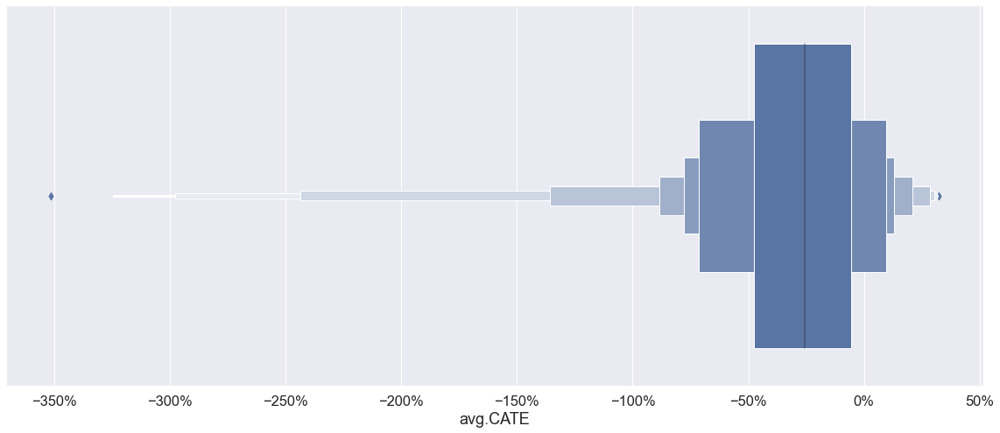

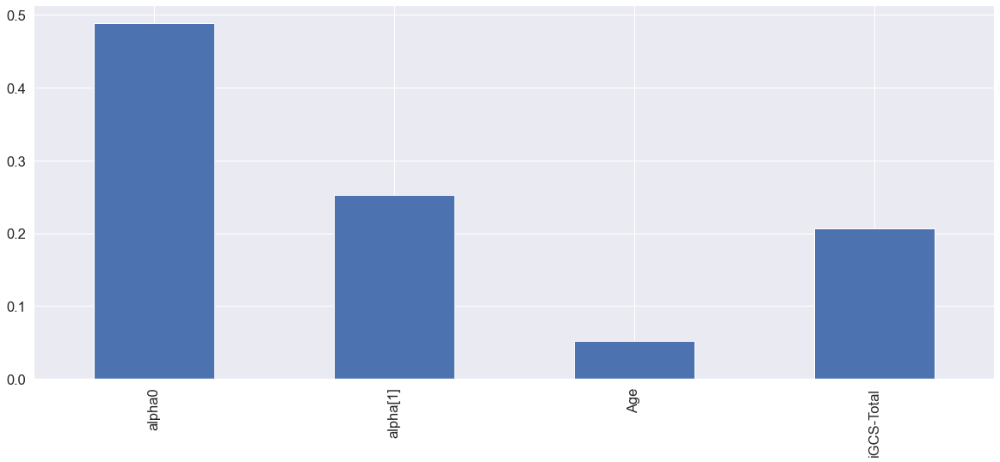

In [20]:
import matplotlib.ticker as ticker
#negative means the drug works, positive means the drug doesn't work
sns.set(font_scale=1.5)
print('Treatment Effects')
print(m.CATE_df[['avg.CATE','$\Delta$ IIC',drug]].mean(axis=0))
fig,ax = plt.subplots(figsize=(20,8))
sns.boxenplot(m.CATE_df['avg.CATE'])
ax.xaxis.set_major_formatter(ticker.PercentFormatter())
print('Distance Metric')
print(pd.concat(m.M_opt_list).mean(axis=0))
fig,ax = plt.subplots(figsize=(20,8))
(pd.concat(m.M_opt_list).mean(axis=0)/pd.concat(m.M_opt_list).mean(axis=0).sum()).plot(kind='bar',ax=ax)
# plt.figure()
# sns.scatterplot(df['IICRatio(Preintervention)'],m.CATE_df['avg.CATE'])

In [79]:
import networkx as nx
from matplotlib import cm

In [80]:
from pyvis.network import Network
sns.set(font_scale=2)

[-1  0 -1 -1  1 -1 -1 -1 -1 -1  1 -1 -1 -1 -1 -1 -1 -1 -1 -1 -1 -1 -1  1
 -1 -1  0  1 -1 -1  0  0  0 -1 -1  1 -1 -1 -1 -1 -1 -1 -1 -1  1 -1 -1  0
  1  1 -1 -1 -1 -1  1  1 -1 -1 -1]


(-2.0, 2.0)

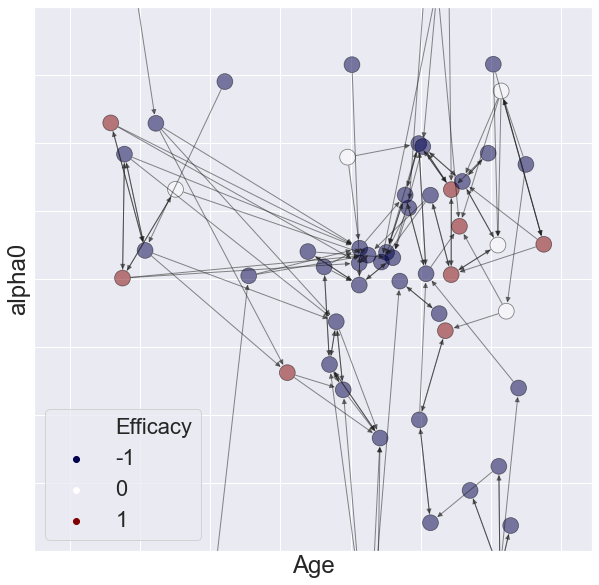

In [100]:
A = m.MG_matrix
G = nx.from_pandas_adjacency(A>27,create_using=nx.DiGraph)
effective_idx = m.CATE_df.loc[m.CATE_df['avg.CATE']<=-10].index
non_effective_idx = m.CATE_df.loc[m.CATE_df['avg.CATE']>=0].index
boundary_idx = m.CATE_df.loc[m.CATE_df['avg.CATE']<=0].index
for idx in list(boundary_idx):
    G.nodes[idx]['group']=0
for idx in list(effective_idx):
    G.nodes[idx]['group']=-1
for idx in non_effective_idx:
    G.nodes[idx]['group']=1
for idx in G.nodes:
    G.nodes[idx]['pos'] = (df.loc[idx]['Age'],df.loc[idx]['alpha0'])
pos=nx.get_node_attributes(G,'pos')
group=nx.get_node_attributes(G,'group')
print(np.array(list(group.values())))
df['Efficacy'] = np.array(list(group.values()))
plt.figure(figsize=(10,10))
sns.scatterplot(x = 'Age',y = 'alpha0',hue='Efficacy',data=df,palette=cm.seismic,s=250,alpha=0.5,edgecolor='black')
nx.draw_networkx_edges(G,pos,alpha=0.5)


plt.ylim((-2,2))
# plt.ylim((-0.6,0.6))
# nx.draw_kamada_kawai(G,node_colo)

In [103]:
A = m.MG_matrix
G = nx.from_pandas_adjacency(A>18,create_using=nx.DiGraph)
effective_idx = m.CATE_df.loc[m.CATE_df['avg.CATE']<=-10].index
non_effective_idx = m.CATE_df.loc[m.CATE_df['avg.CATE']>0].index
boundary_idx = m.CATE_df.loc[m.CATE_df['avg.CATE']<=0].index
for idx in list(boundary_idx):
    G.nodes[idx]['group']=1
for idx in list(effective_idx):
    G.nodes[idx]['group']=2
for idx in non_effective_idx:
    G.nodes[idx]['group']=0


In [104]:
nt = Network(height=700,width=800,notebook=True)
nt.from_nx(G)
nt.show('G.html')

In [108]:
X2 = data_1.loc[['sid833','sid872','sid876','sid994','sid821','sid1039','sid1055']]
Y2 = outcomes.loc[['sid833','sid872','sid876','sid994','sid821','sid1039','sid1055']]
Y2

,DC MRS (modified ranking scale),DC GOSE (extended glasgow outcome scale),"DC dispo home=1, rehab=2, SNF =3, hospice =4, dead =5"
Index,,,
sid833,6,1,5.0
sid872,6,1,5.0
sid876,4,4,2.0
sid994,2,8,2.0
sid821,6,1,5.0
sid1039,4,4,1.0
sid1055,6,1,5.0


<AxesSubplot:xlabel='levetiracetam', ylabel='avg.CATE'>

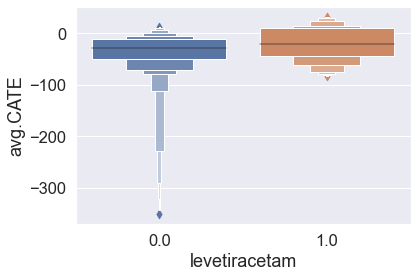

In [21]:
sns.boxenplot(x=drug,y='avg.CATE',data=m.CATE_df)

In [170]:
import umap.umap_ as umap
from sklearn.preprocessing import StandardScaler
reducer = umap.UMAP(n_neighbors=n_neighbors,min_dist=min_dist,n_components=n_components,metric=metric)

In [174]:
X = covariates[['Gender','Age',
                'Hx CVA (including TIA)','Hx HTN','Hx Sz /epilepsy',
                'Hx brain surgery','Worst GCS in 1st 24',
                'neuro_dx_Seizures/status epilepticus','prim_dx_Respiratory disorders']].values
scaled_X = StandardScaler().fit_transform(X)
embedding = reducer.fit_transform(scaled_X)
embedding.shape

(72, 2)

Text(0.5, 1.0, 'UMAP Preadmission Cov')

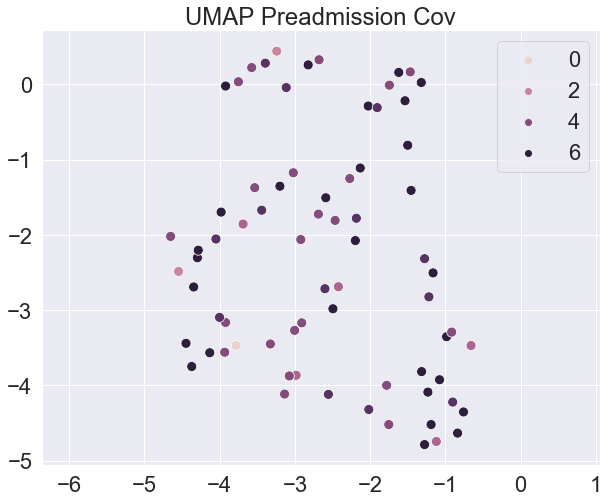

In [180]:
sns.color_palette()[1]

(0.8666666666666667, 0.5176470588235295, 0.3215686274509804)

In [ ]:
posterior_rule = lm.LogisticRegression().fit(X=covariates[['Gender','Age',
                                                                             'Hx CVA (including TIA)','Hx HTN','Hx Sz /epilepsy',
                                                                             'Hx brain surgery','Worst GCS in 1st 24',
                                                                             'neuro_dx_Seizures/status epilepticus','prim_dx_Respiratory disorders']].fillna(0),
                                                               y=m.CATE_df['avg.CATE']<0)

sid30


Text(0.5, 1.0, 'propofol')

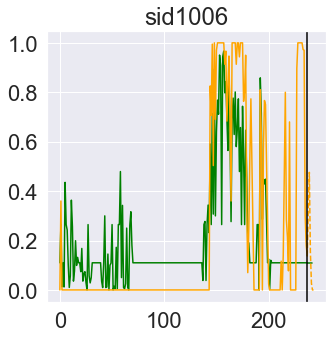

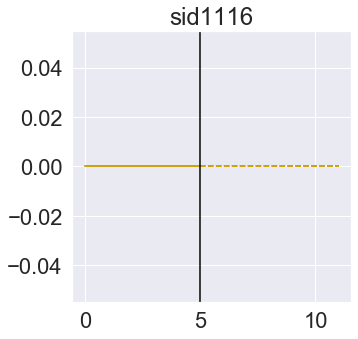

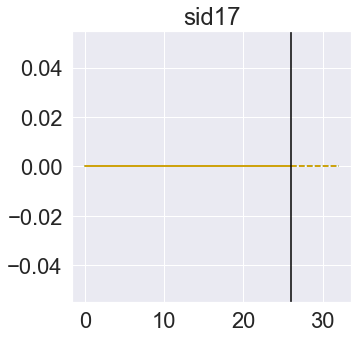

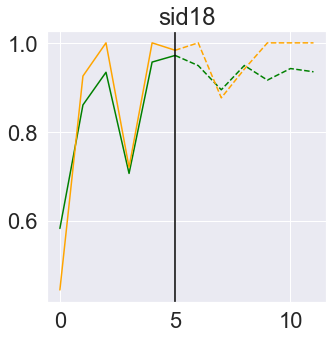

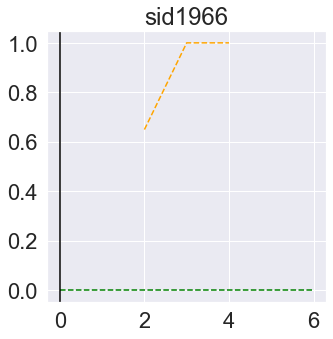

...

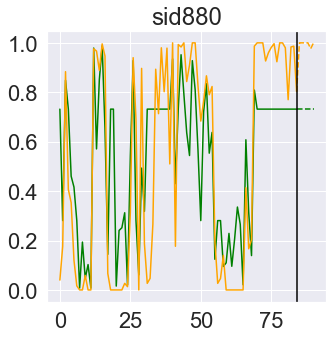

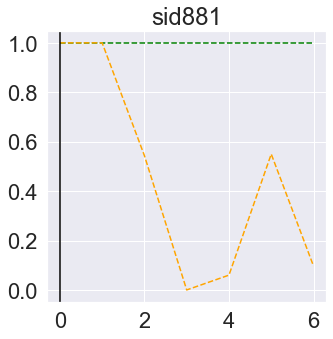

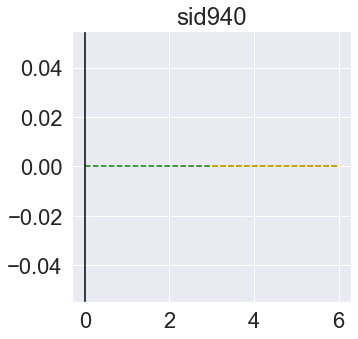

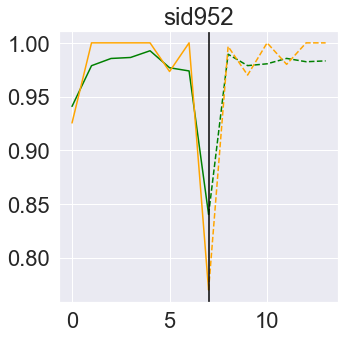

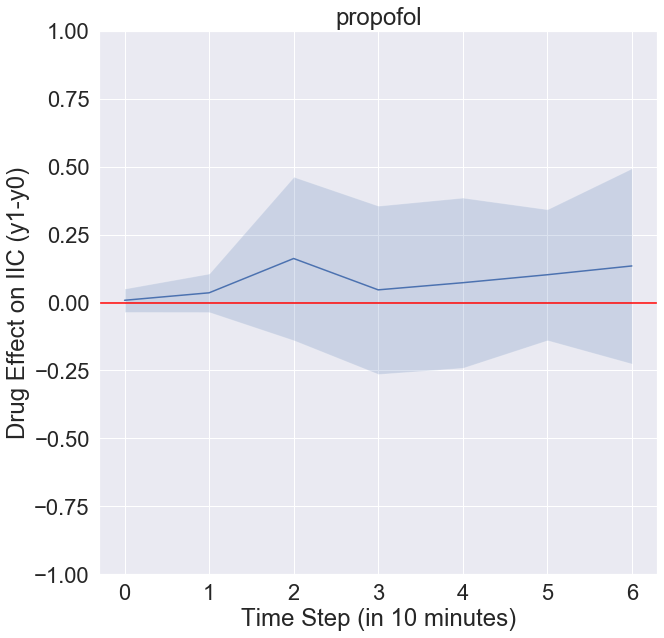

In [146]:
effect = []
for idx in m.CATE_df.index:
    if df.loc[idx,drug]==1:
        toi = time_of_int.loc[idx,0]
        mg_0 = df.loc[(m.MG_matrix.loc[idx]>0),drug]==0
        mg_0 = mg_0[mg_0==True]
        mg_0 = time_of_int.loc[mg_0.index,0]>(toi+f)
        mg_0 = mg_0[mg_0==True]
        if len(mg_0)>0:
            mg_1_preint = Pobs_pre.loc[idx,:toi].interpolate(method='linear', limit_direction='forward').fillna(method='bfill').fillna(0)
            mg_0_preint = Pobs_pre.loc[mg_0.index,:toi].interpolate(method='linear', limit_direction='forward', axis=1).fillna(method='bfill').fillna(0)
            mg_0_outcome = Pobs_pre.loc[mg_0.index,toi:toi+f].interpolate(method='linear', limit_direction='forward', axis=1).fillna(method='bfill').fillna(0)
            model = ensemble.RandomForestRegressor().fit(mg_0_preint.T,mg_1_preint)
            fig = plt.figure(figsize=(5,5))
    #         plt.plot(mg_0_outcome.mean(axis=0))
    #         plt.plot(short_term_outcome.loc[idx])
            mg_0_preint_m = model.predict(mg_0_preint.T)
            mg_0_outcome_m = model.predict(mg_0_outcome.T)
            preint = mg_1_preint.to_numpy() - mg_0_preint_m
            
            eff = short_term_outcome.loc[idx].to_numpy() - mg_0_outcome_m
            plt.plot(np.arange(0,toi+1),mg_0_preint_m,c='green')
            plt.plot(np.arange(toi,toi+f+1),mg_0_outcome_m,c='green',ls='--')
            plt.plot(np.arange(0,toi+1),mg_1_preint.to_numpy(),c='orange')
            plt.plot(np.arange(toi,toi+f+1),short_term_outcome.loc[idx].to_numpy(),c='orange',ls='--')
            plt.axvline(toi,c='black')
            plt.title(idx)
            effect.append(eff)
        else:
            print(idx)
effect = np.array(effect)
fig = plt.figure(figsize=(10,10))
plt.plot(np.arange(0,f+1),np.nanmean(effect,axis=0))
plt.fill_between(np.arange(0,f+1),
                 np.nanmean(effect,axis=0)+np.std(np.nan_to_num(effect),axis=0),
                 np.nanmean(effect,axis=0)-np.std(np.nan_to_num(effect),axis=0),alpha=0.2)
plt.axhline(0,c='red')
plt.xlabel('Time Step (in 10 minutes)')
plt.ylabel('Drug Effect on IIC (y1-y0)')
plt.ylim((-1,1))
plt.title(drug)

In [278]:
toi = time_of_int.loc[idx,0]
mg_0 = df.loc[(m.MG_matrix.loc[idx]>0),drug]==0
mg_0 = mg_0[mg_0==True]
print(mg_0.index)
mg_0 = time_of_int.loc[mg_0.index,0]>toi
mg_0 = mg_0[mg_0==True]
Pobs_pre.loc[mg_0.index,toi:toi+f].mean(axis=0).to_numpy()

Index(['sid8', 'sid18', 'sid30', 'sid88', 'sid327', 'sid406', 'sid456',
       'sid490', 'sid557', 'sid734', 'sid821', 'sid824', 'sid827', 'sid839',
       'sid852', 'sid872', 'sid881', 'sid940', 'sid960', 'sid983', 'sid1022',
       'sid1116', 'sid1956', 'sid1966'],
      dtype='object')


array([0.59174541, 0.53722222, 0.54611111, 0.49480969, 0.49532164,
       0.49388889, 0.5       , 0.55503584, 0.36131387, 0.36649215,
       0.38722222, 0.37111111, 0.42555556])

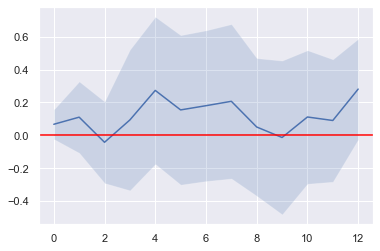

In [301]:
plt.plot(np.arange(0,13),np.nanmean(effect,axis=0))
plt.fill_between(np.arange(0,13),
                 np.nanmean(effect,axis=0)+np.std(np.nan_to_num(effect),axis=0),
                 np.nanmean(effect,axis=0)-np.std(np.nan_to_num(effect),axis=0),alpha=0.2)
plt.axhline(0,c='red')

# Part 4 Outcome Regression

In [23]:
import numpy as np
import pandas as pd
import sklearn.tree as tree
import matplotlib.pyplot as plt
import seaborn as sns
import warnings
import numpy as np
import pandas as pd
import sklearn.tree as tree
import matplotlib.pyplot as plt
import seaborn as sns
import scipy
import scipy.io as sio
import tqdm
import os
import sklearn.ensemble as ensemble
import sklearn.linear_model as lm
import sklearn.tree as tree
import mord
from sklearn.model_selection import train_test_split
from sklearn.neighbors import DistanceMetric
import networkx as nx
from sklearn.metrics import confusion_matrix

#data_dir = '/home/kentaro/Dropbox/'
data_dir = '/Users/harshparikh/IIC/step1_output/'
warnings.filterwarnings("ignore")

In [24]:
covariates = pd.read_csv(data_dir+'covariates.csv',index_col=0)
covariates.head()

,Gender,Age,marrital,APACHE II first 24,Hx CVA (including TIA),Hx HTN,Hx Sz /epilepsy,Hx brain surgery,Hx CKD,Hx CAD/MI,...,iGCS-Total,iGCS = T?,iGCS-E,iGCS-V,iGCS-M,Worst GCS in 1st 24,Worst GCS Intubation status,iGCS actual scores,neuro_dx_Seizures/status epilepticus,prim_dx_Respiratory disorders
Index,,,,,,,,,,,,,,,,,,,,,
sid1,0,19.93,0.0,NaN,0.0,0.0,0.0,0.0,0.0,0.0,...,11,0,4,1,6,11,0,11,0,0
sid2,0,85.01,0.0,NaN,0.0,1.0,0.0,0.0,1.0,0.0,...,7,0,1,2,4,3,1,3,0,1
sid3,1,45.91,1.0,NaN,0.0,0.0,1.0,0.0,0.0,0.0,...,8,0,3,1,4,8,0,8,0,1
sid4,1,53.99,1.0,NaN,0.0,0.0,0.0,1.0,0.0,0.0,...,4,0,1,2,1,3,1,4,0,1
sid5,1,23.08,0.0,NaN,0.0,0.0,1.0,0.0,0.0,0.0,...,6,1,1,1,4,3,1,6,1,0


In [25]:
outcomes = pd.read_csv(data_dir+'outcomes.csv',index_col=0)
outcomes.head()

,DC MRS (modified ranking scale),DC GOSE (extended glasgow outcome scale),"DC dispo home=1, rehab=2, SNF =3, hospice =4, dead =5"
Index,,,
sid1,3,5,1.0
sid2,5,2,4.0
sid3,6,1,5.0
sid4,6,1,5.0
sid5,2,6,1.0


<AxesSubplot:xlabel='DC MRS (modified ranking scale)', ylabel='count'>

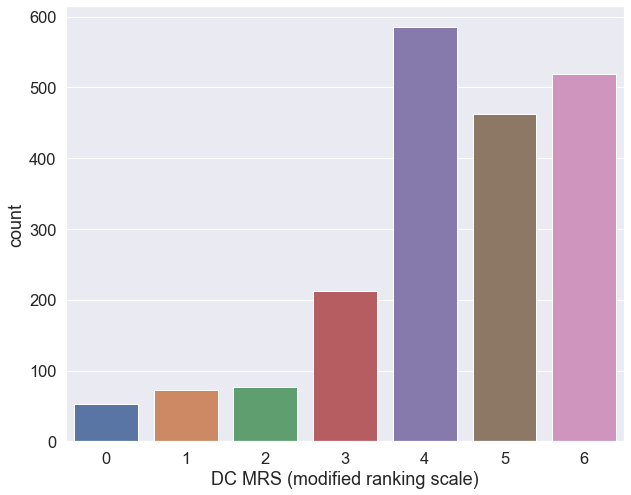

In [26]:
sns.set(font_scale=1.5)
plt.figure(figsize=(10,8))
sns.countplot(x="DC MRS (modified ranking scale)", 
              data=outcomes[['DC MRS (modified ranking scale)']].loc[outcomes['DC MRS (modified ranking scale)']!='na'].dropna().astype(int))

### Outcome Regression: (C,Theta -> Y)

#### ignore this

0.8342857142857143
0.82
[[ 65 106]
 [ 20 509]]


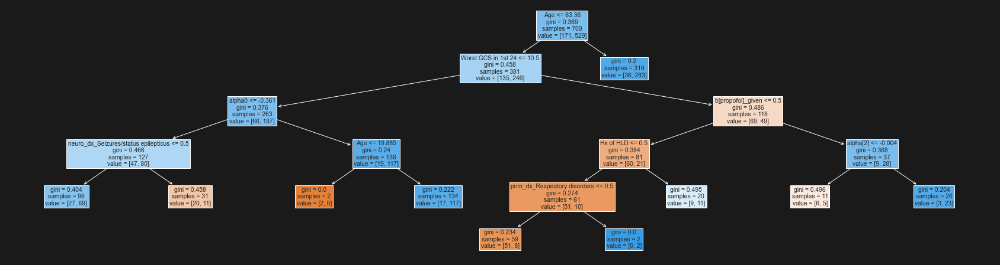

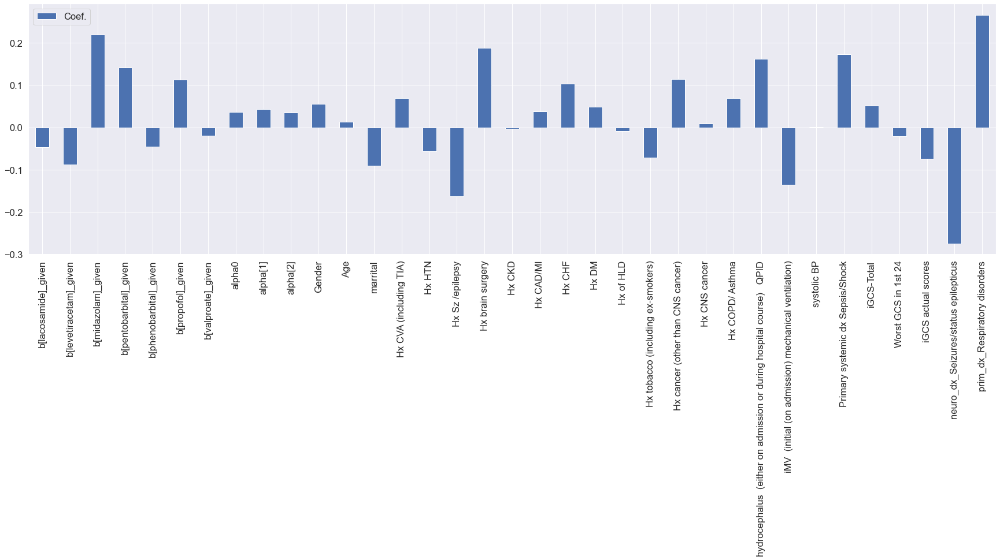

In [51]:
#thetas = pd.read_csv('/home/kentaro/github/iic_causal_inference/aim1/step4_simulator/results_iic_burden/params_std_CNNIIC_cauchy_expit_lognormal_drugoutside_ARMA2,6_iter1000.csv',index_col=0)
thetas = pd.read_csv('/Users/harshparikh/Documents/GitHub/iic_causal_inference/aim1/step6_simulator/results_iic_burden/params_mean_CNNIIC_cauchy_expit_lognormal_drugoutside_ARMA2,6_iter1000.csv',index_col=0)
thetas = thetas.fillna(0)
# print(thetas.columns)
theta_prime = (thetas[['b[lacosamide]', 'b[levetiracetam]', 'b[midazolam]', 'b[pentobarbital]','b[phenobarbital]', 'b[propofol]','b[valproate]']]>0.001).astype(int).rename(columns={name:name+'_given' for name in ['b[lacosamide]', 'b[levetiracetam]', 'b[midazolam]', 'b[pentobarbital]','b[phenobarbital]', 'b[propofol]','b[valproate]']})
thetas = thetas[['alpha0', 'alpha[1]', 'alpha[2]',
#         'b[lacosamide]', 'b[levetiracetam]', 'b[midazolam]', 'b[pentobarbital]','b[phenobarbital]',
#         'b[propofol]', 'b[valproate]', 
        'Gender', 'Age',
       'marrital', 'Hx CVA (including TIA)', 'Hx HTN',
       'Hx Sz /epilepsy', 'Hx brain surgery', 'Hx CKD', 'Hx CAD/MI', 'Hx CHF',
       'Hx DM', 'Hx of HLD', 'Hx tobacco (including ex-smokers)',
       'Hx cancer (other than CNS cancer)', 'Hx CNS cancer', 'Hx COPD/ Asthma',
       'hydrocephalus  (either on admission or during hospital course)   QPID',
       'iMV  (initial (on admission) mechanical ventilation)', 'systolic BP',
       'Primary systemic dx Sepsis/Shock', 
        'iGCS-Total','Worst GCS in 1st 24', 'iGCS actual scores',
       'neuro_dx_Seizures/status epilepticus',
       'prim_dx_Respiratory disorders']].fillna(0)



thetas = theta_prime.join(thetas,lsuffix='_given')

Y = (outcomes[['DC MRS (modified ranking scale)']].loc[list(thetas.index)])
Y = Y.loc[Y['DC MRS (modified ranking scale)']!='4']
Y = (Y.loc[Y['DC MRS (modified ranking scale)']!='na'].dropna().astype(int) > 4).astype(int)


thetas = thetas.loc[list(Y.index)]

# print(thetas.columns)
outcome_pred_model = tree.DecisionTreeClassifier(criterion='gini',max_leaf_nodes=10).fit(thetas,Y)
outcome_pred_model2 = lm.RidgeClassifierCV().fit(thetas,Y)

sns.set(font_scale=1.5)
fig,ax = plt.subplots(figsize=(30,8),facecolor='k')
tree.plot_tree(outcome_pred_model,feature_names=list(thetas.columns),filled=True)

coef = pd.DataFrame(outcome_pred_model2.coef_[0],index=list(thetas.columns),columns=['Coef.'])
fig,ax = plt.subplots(figsize=(30,8))
coef.plot(kind='bar',ax=ax)

# fig,ax = plt.subplots(figsize=(20,8))
# thetas[['alpha0', 'alpha[1]', 'alpha[2]','b[lacosamide]', 'b[levetiracetam]', 'b[midazolam]', 'b[propofol]', 'b[valproate]']].plot(kind='box',ax=ax)

print(outcome_pred_model.score(thetas,Y))
print(outcome_pred_model2.score(thetas,Y))
# thetas[['alpha0', 'alpha[1]', 'alpha[2]','theta[1]', 'theta[2]','theta[3]', 'theta[4]', 'theta[5]', 'theta[6]']].head()

Y_hat = outcome_pred_model2.predict(thetas)
print(confusion_matrix(Y,Y_hat))

In [30]:
import sklearn.ensemble as ensemble

In [28]:
import plotly.express as px

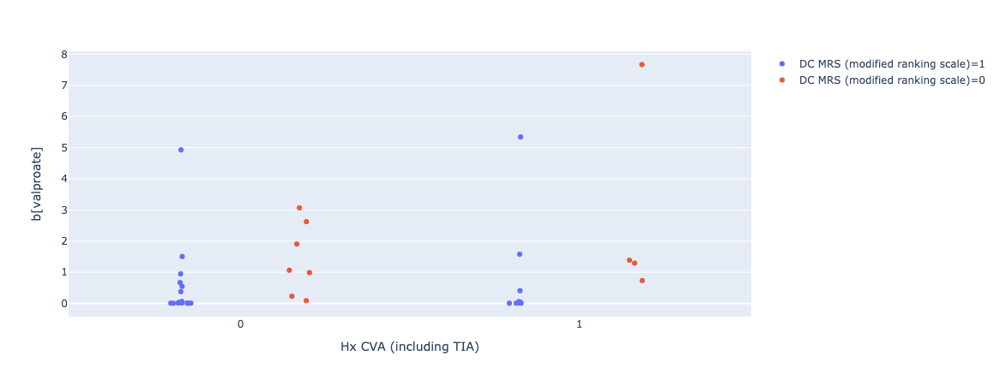

In [29]:
x = thetas['Age']
y = thetas['Worst GCS in 1st 24']
z = thetas['alpha0']
theta_full = thetas.join(Y.astype(str),how='inner')
theta_full['GCS-Severe (Below 9)'] = (theta_full['iGCS actual scores']<=9).astype(int)
theta_full['Old (Age>60)'] = (theta_full['Age']>=60).astype(int)
fig = px.box(theta_full.loc[theta_full['b[valproate]_given']!=0],
             x='Hx CVA (including TIA)',
             y='b[valproate]',
             color='DC MRS (modified ranking scale)')#,opacity=0.4)
fig = px.strip(theta_full.loc[theta_full['b[valproate]_given']!=0],
             x='Hx CVA (including TIA)',
             y='b[valproate]',
             color='DC MRS (modified ranking scale)')
# fig = px.scatter_3d(theta_full,x='b[propofol]_given',y='iGCS-Total',z='b[propofol]',color='DC MRS (modified ranking scale)',opacity=0.4)
fig.show()
# c = Y
# my_cmap = plt.get_cmap('RdBu_r')
# ax.scatter3D(x, y, z, c = Y['DC MRS (modified ranking scale)'], cmap = my_cmap,alpha=0.4)
# ax.set_xlabel('Age', fontweight ='bold') 
# ax.set_ylabel('Worst GCS in 1st 24h', fontweight ='bold') 
# ax.set_zlabel('Alpha0', fontweight ='bold') 

#### Outcome Regression using Decision Tree and Ridge Classifier

0.8028571428571428
[[ 27  58]
 [ 11 254]]


[Text(837.0, 951.3000000000001, 'Worst GCS in 1st 24 <= 10.5\ngini = 0.371\nsamples = 350\nvalue = [86, 264]'),
 Text(418.5, 679.5, 'alpha0 <= -0.361\ngini = 0.261\nsamples = 240\nvalue = [37, 203]'),
 Text(209.25, 407.70000000000005, 'gini = 0.39\nsamples = 113\nvalue = [30, 83]'),
 Text(627.75, 407.70000000000005, 'gini = 0.104\nsamples = 127\nvalue = [7, 120]'),
 Text(1255.5, 679.5, 'Age <= 65.085\ngini = 0.494\nsamples = 110\nvalue = [49, 61]'),
 Text(1046.25, 407.70000000000005, 'b[propofol]_given <= 0.5\ngini = 0.478\nsamples = 66\nvalue = [40, 26]'),
 Text(837.0, 135.89999999999998, 'gini = 0.38\nsamples = 47\nvalue = [35, 12]'),
 Text(1255.5, 135.89999999999998, 'gini = 0.388\nsamples = 19\nvalue = [5, 14]'),
 Text(1464.75, 407.70000000000005, 'gini = 0.325\nsamples = 44\nvalue = [9, 35]')]

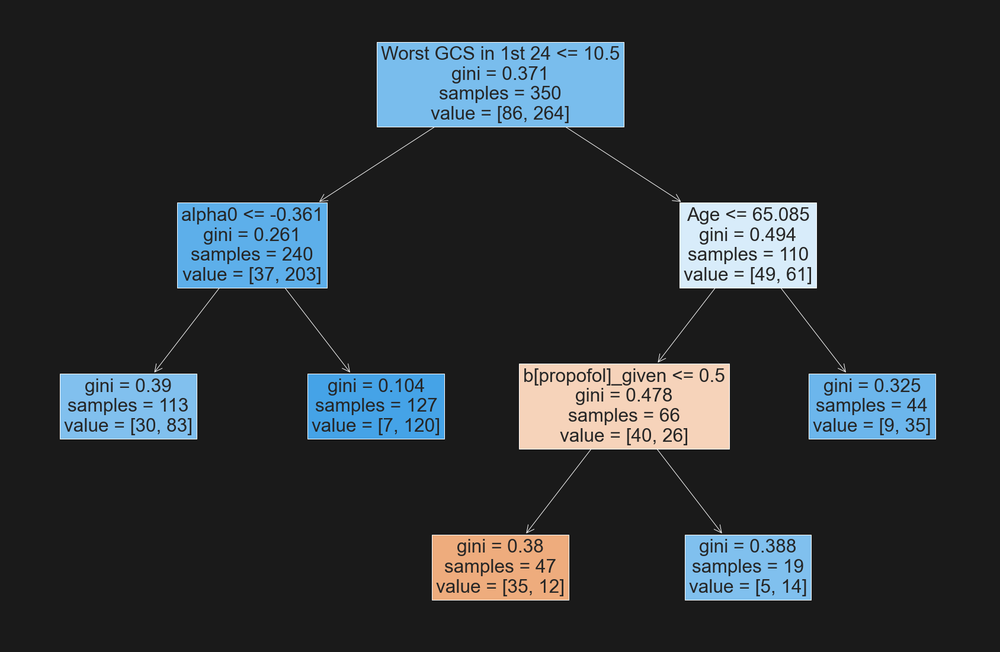

In [53]:
#Hyperparameters chosen using CV
X_train, X_test, y_train, y_test = train_test_split(thetas, Y, test_size=0.5, random_state=42)
outcome_model_full = tree.DecisionTreeClassifier(criterion='gini',min_samples_leaf=0.042,max_leaf_nodes=5).fit(X_train,y_train)
print(outcome_model_full.score(X_test,y_test))
y_test_hat = outcome_model_full.predict(X_test)
print(confusion_matrix(y_test,y_test_hat))
sns.set(font_scale=1.5)
fig,ax = plt.subplots(figsize=(30,20),facecolor='k')
tree.plot_tree(outcome_model_full,feature_names=list(thetas.columns),filled=True)

0.7971428571428572
[[ 32  53]
 [ 18 247]]


<AxesSubplot:>

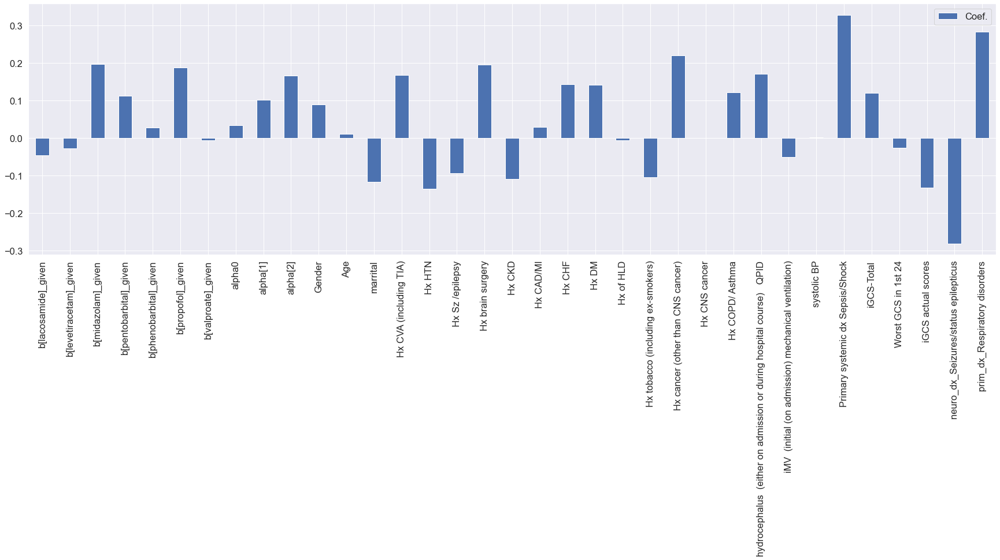

In [54]:
X_train, X_test, y_train, y_test = train_test_split(thetas, Y, test_size=0.5, random_state=42)
outcome_model_full = lm.RidgeClassifierCV(normalize=False).fit(X_train,y_train)
print(outcome_model_full.score(X_test,y_test))
y_test_hat = outcome_model_full.predict(X_test)
print(confusion_matrix(y_test,y_test_hat))
sns.set(font_scale=1.5)
coef = pd.DataFrame(outcome_model_full.coef_[0],index=list(thetas.columns),columns=['Coef.'])
fig,ax = plt.subplots(figsize=(30,8))
coef.plot(kind='bar',ax=ax)

[1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1.
 1. 1. 1. 1. 1. 1. 1. 1.]
0.7542857142857143
[[ 35  50]
 [ 36 229]]


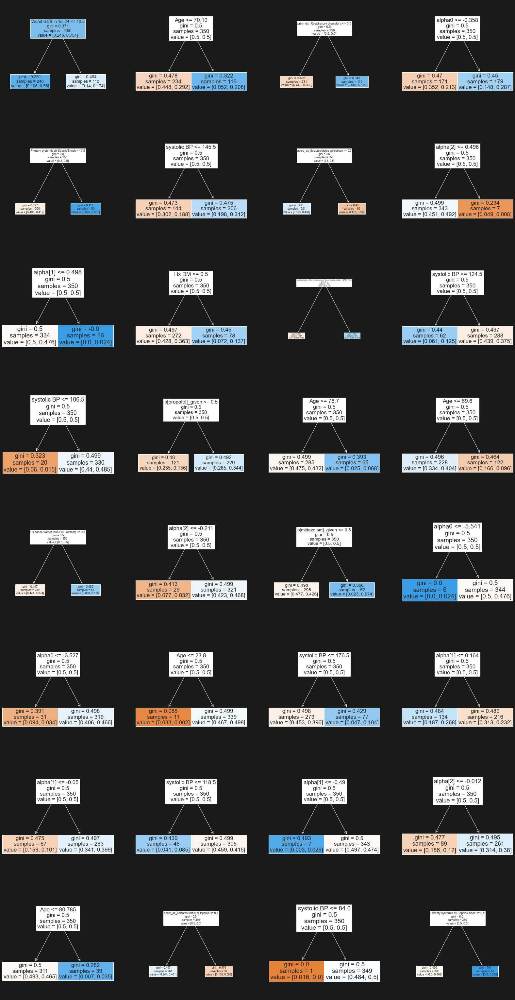

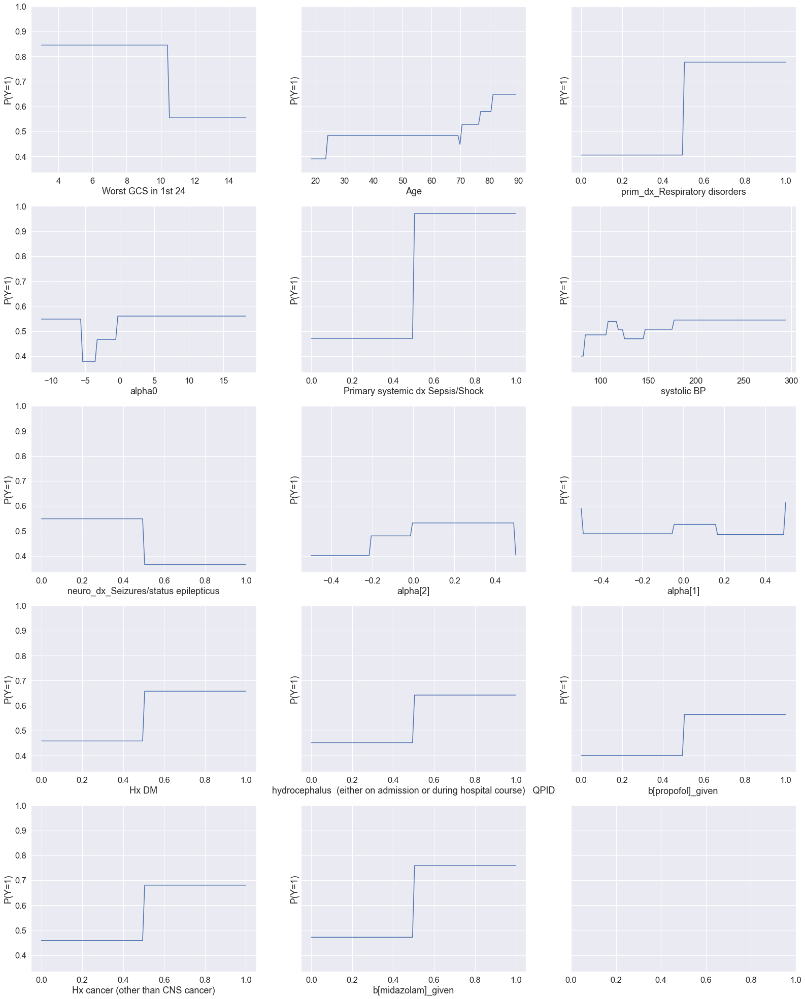

In [75]:
X_train, X_test, y_train, y_test = train_test_split(thetas, Y, test_size=0.5, random_state=42)
additive_model = ensemble.AdaBoostClassifier(n_estimators=32).fit(X_train,y_train)
print(additive_model.estimator_weights_)
print(additive_model.score(X_test,y_test))
y_test_hat = additive_model.predict(X_test)
print(confusion_matrix(y_test,y_test_hat))
estimators = additive_model.estimators_
fig,ax = plt.subplots( ncols=4, nrows=( (len(estimators)-1)//4) + 1, figsize=(28,7*(( (len(estimators)-1)//4) + 1)),facecolor='k')
estimator_f = {}
for i in range(len(estimators)):
    estimator = estimators[i]
    idx = (np.argmax(estimator.feature_importances_))
    if idx not in estimator_f:
        estimator_f[idx] = []
    estimator_f[idx] = estimator_f[idx] + [estimator]
    axi = ax[i//4,i%4]
    tree.plot_tree(estimator,feature_names=list(thetas.columns),filled=True,ax=axi)
fig.savefig('adaBoost_Estimators.png')

samples = 100
cols = list(thetas.columns)
fig,ax = plt.subplots(ncols=3, nrows=( (len(estimator_f.keys())-1)//3) + 1, figsize=(27,7*(( (len(estimator_f.keys())-1)//3) + 1)),sharex=False,sharey=True)
i = 0
for key in estimator_f.keys():
    x_range = np.min(thetas[cols[key]]),np.max(thetas[cols[key]])
    X1 = np.zeros((samples,len(cols)))
    X1[:,key] = np.linspace(x_range[0],x_range[1],num=100)
    est_k = estimator_f[key]
    y_hat = np.zeros((samples,2))
    for estr in est_k:
        y_hat += estr.predict_proba(X1).reshape((samples,2))
    y_hat = y_hat/len(est_k)
    axi = ax[i//3,i%3]
    axi.plot(X1[:,key],y_hat[:,1])
    axi.set_xlabel(cols[key])
    axi.set_ylabel('P(Y=1)')
    i += 1
fig.savefig('adaBoost_f.png')

In [65]:
estimator_f.keys()

dict_keys([31, 11, 34, 7, 29, 28, 33, 9, 8, 20, 26, 5, 23, 2, 30, 32, 10, 16, 13, 12])

In [17]:
#why is the classifier so bad?
thetas = pd.read_csv('/home/kentaro/github/iic_causal_inference/aim1/step4_simulator/results_iic_burden/params_std_CNNIIC_cauchy_expit_lognormal_drugoutside_ARMA2,6_iter1000.csv',index_col=0)
#thetas = pd.read_csv('/Users/harshparikh/Documents/GitHub/iic_causal_inference/aim1/step4_simulator/results/params_CNNIIC_cauchy_expit_lognormal_drugoutside_ARMA2,6_iter1000.csv',index_col=0)
thetas = thetas.fillna(0)
theta_prime = (thetas[['b[lacosamide]', 'b[levetiracetam]', 'b[midazolam]', 'b[pentobarbital]','b[phenobarbital]', 'b[propofol]','b[valproate]']]>0.001).astype(int).rename(columns={name:name+'_given' for name in ['b[lacosamide]', 'b[levetiracetam]', 'b[midazolam]', 'b[pentobarbital]','b[phenobarbital]', 'b[propofol]','b[valproate]']})
thetas = thetas[['alpha0', 'alpha[1]', 'alpha[2]',
        'b[lacosamide]', 'b[levetiracetam]', 'b[midazolam]', 'b[propofol]', 'b[valproate]', 
        'Gender', 'Age',
       'marrital', 'Hx CVA (including TIA)', 'Hx HTN',
       'Hx Sz /epilepsy', 'Hx brain surgery', 'Hx CKD', 'Hx CAD/MI', 'Hx CHF',
       'Hx DM', 'Hx of HLD', 'Hx tobacco (including ex-smokers)',
       'Hx cancer (other than CNS cancer)', 'Hx CNS cancer', 'Hx COPD/ Asthma',
       'hydrocephalus  (either on admission or during hospital course)   QPID',
       'iMV  (initial (on admission) mechanical ventilation)', 'systolic BP',
       'Primary systemic dx Sepsis/Shock', 'iGCS-Total','Worst GCS in 1st 24', 'iGCS actual scores',
       'neuro_dx_Seizures/status epilepticus',
       'prim_dx_Respiratory disorders']].fillna(0)



thetas = theta_prime.join(thetas,lsuffix='_given')

Y = (outcomes[['DC MRS (modified ranking scale)']].loc[list(thetas.index)])
Y = (Y.loc[Y['DC MRS (modified ranking scale)']!='na'].dropna().astype(int) > 3).astype(int)
thetas = thetas.loc[list(Y.index)]


outcome_pred_model2 = lm.RidgeClassifierCV().fit(thetas,Y)
Y_hat = outcome_pred_model2.predict(thetas)

print(1-outcome_pred_model2.score(thetas,Y))
print(confusion_matrix(Y,Y_hat))



         DC MRS (modified ranking scale)
Index                                   
sid2                                   1
sid3                                   1
sid4                                   1
sid5                                   0
sid7                                   1
...                                  ...
sid1985                                1
sid1986                                1
sid1989                                0
sid1990                                0
sid1991                                1

[1025 rows x 1 columns]
         DC MRS (modified ranking scale)
Index                                   
sid2                                   1
sid3                                   1
sid4                                   1
sid5                                   0
sid7                                   1
...                                  ...
sid1985                                1
sid1986                                1
sid1989                         

In [332]:
#does min max scaling help?
from sklearn import preprocessing

mm_scaler = preprocessing.StandardScaler()
theta_tilde = mm_scaler.fit_transform(theta_tilde)



outcome_pred_model2 = lm.RidgeClassifierCV().fit(theta_tilde,Y)
Y_hat = outcome_pred_model2.predict(theta_tilde)

print(1-outcome_pred_model2.score(theta_tilde,Y))
print(confusion_matrix(Y,Y_hat))



0.1768901569186876
[[ 62 108]
 [ 16 515]]


In [333]:
from sklearn.model_selection import cross_val_score
from sklearn  import svm
clf = svm.SVC(kernel='linear', C=1)
scores = cross_val_score(clf, theta_tilde, Y, cv=5)
1-scores

rfc = RandomForestClassifier(n_estimators=10).fit(theta_tilde, Y)
scores = cross_val_score(rfc, theta_tilde, Y, cv=5)
1-scores





array([0.20567376, 0.2       , 0.22857143, 0.26428571, 0.17857143])

[Text(744.0, 951.3000000000001, 'Age <= 62.69\ngini = 0.5\nsamples = 856\nvalue = [428, 428]'),
 Text(372.0, 679.5, 'prim_dx_Respiratory disorders <= 0.5\ngini = 0.467\nsamples = 509\nvalue = [320, 189]'),
 Text(186.0, 407.70000000000005, 'gini = 0.414\nsamples = 393\nvalue = [278, 115]'),
 Text(558.0, 407.70000000000005, 'gini = 0.462\nsamples = 116\nvalue = [42, 74]'),
 Text(1116.0, 679.5, 'iGCS actual scores <= 10.5\ngini = 0.429\nsamples = 347\nvalue = [108, 239]'),
 Text(930.0, 407.70000000000005, 'gini = 0.289\nsamples = 177\nvalue = [31, 146]'),
 Text(1302.0, 407.70000000000005, 'Age <= 73.635\ngini = 0.496\nsamples = 170\nvalue = [77, 93]'),
 Text(1116.0, 135.89999999999998, 'gini = 0.456\nsamples = 94\nvalue = [61, 33]'),
 Text(1488.0, 135.89999999999998, 'gini = 0.332\nsamples = 76\nvalue = [16, 60]')]

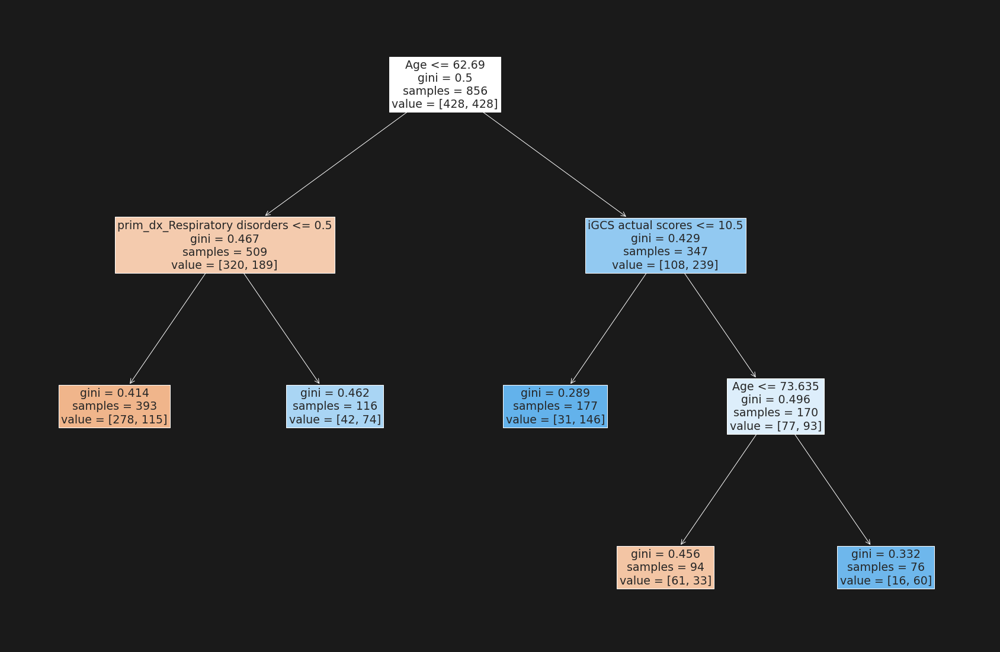

In [403]:
sns.set(font_scale=1.5)
fig,ax = plt.subplots(figsize=(30,20),facecolor='k')
tree.plot_tree(outcome_pred_model_tree,feature_names=list(thetas.columns),filled=True)

0.7730496453900709


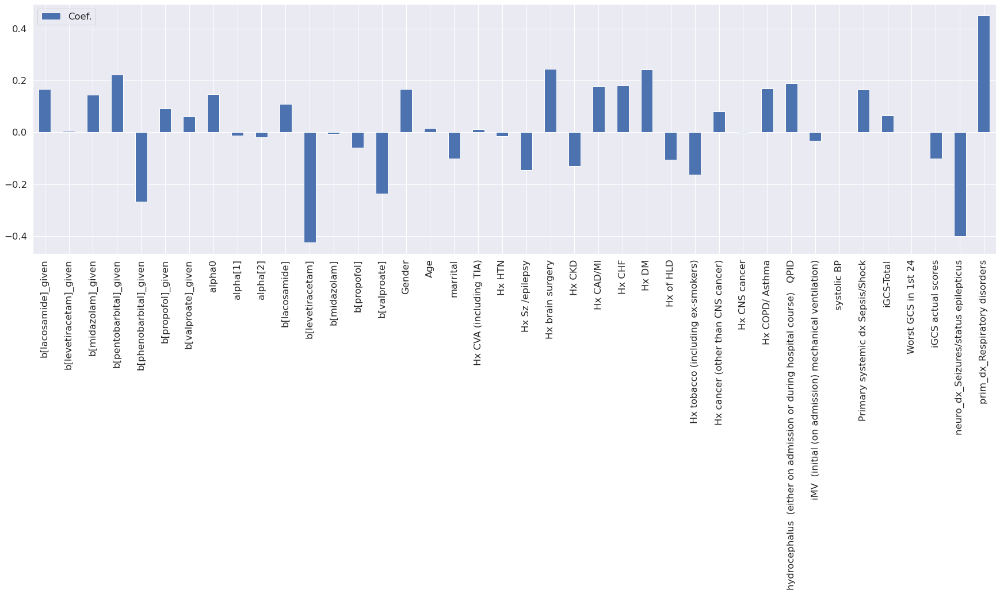

In [404]:
print(outcome_pred_model2.score(X_test,y_test))
sns.set(font_scale=1.5)
coef = pd.DataFrame(outcome_pred_model_ridgelogistic.coef_[0],index=list(thetas.columns),columns=['Coef.'])
fig,ax = plt.subplots(figsize=(30,8))
coef.plot(kind='bar',ax=ax)

In [398]:
from sklearn.metrics import confusion_matrix
from sklearn import metrics
from mord import LogisticAT

#why is the classifier so bad?
thetas = pd.read_csv('/home/kentaro/github/iic_causal_inference/aim1/step4_simulator/results_iic_burden/params_std_CNNIIC_cauchy_expit_lognormal_drugoutside_ARMA2,6_iter1000.csv',index_col=0)
#thetas = pd.read_csv('/Users/harshparikh/Documents/GitHub/iic_causal_inference/aim1/step4_simulator/results/params_CNNIIC_cauchy_expit_lognormal_drugoutside_ARMA2,6_iter1000.csv',index_col=0)
thetas = thetas.fillna(0)
theta_prime = (thetas[['b[lacosamide]', 'b[levetiracetam]', 'b[midazolam]', 'b[pentobarbital]','b[phenobarbital]', 'b[propofol]','b[valproate]']]>0.001).astype(int).rename(columns={name:name+'_given' for name in ['b[lacosamide]', 'b[levetiracetam]', 'b[midazolam]', 'b[pentobarbital]','b[phenobarbital]', 'b[propofol]','b[valproate]']})
thetas = thetas[['alpha0', 'alpha[1]', 'alpha[2]',
        'b[lacosamide]', 'b[levetiracetam]', 'b[midazolam]', 'b[propofol]', 'b[valproate]', 
        'Gender', 'Age',
       'marrital', 'Hx CVA (including TIA)', 'Hx HTN',
       'Hx Sz /epilepsy', 'Hx brain surgery', 'Hx CKD', 'Hx CAD/MI', 'Hx CHF',
       'Hx DM', 'Hx of HLD', 'Hx tobacco (including ex-smokers)',
       'Hx cancer (other than CNS cancer)', 'Hx CNS cancer', 'Hx COPD/ Asthma',
       'hydrocephalus  (either on admission or during hospital course)   QPID',
       'iMV  (initial (on admission) mechanical ventilation)', 'systolic BP',
       'Primary systemic dx Sepsis/Shock', 'iGCS-Total','Worst GCS in 1st 24', 'iGCS actual scores',
       'neuro_dx_Seizures/status epilepticus',
       'prim_dx_Respiratory disorders']].fillna(0)

#why is the classifier so bad?
Y = (outcomes[['DC MRS (modified ranking scale)']].loc[list(thetas.index)])
Y = (Y.loc[Y['DC MRS (modified ranking scale)']!='na'].dropna().astype(int) ).astype(int)



theta_tilde = thetas.loc[list(Y.index)]


Y = Y.to_numpy()

clf2 = mord.LogisticAT(alpha=1.)
clf2.fit(theta_tilde, Y)


print('Mean Absolute Error of LogisticAT %s' %
      metrics.mean_absolute_error(clf2.predict(theta_tilde), Y))

Y_hat = clf2.predict(theta_tilde)
print(confusion_matrix(Y,Y_hat))



Mean Absolute Error of LogisticAT 0.8721951219512195
[[  0   0   0   5  10   0   0]
 [  0   1   0   6  17   3   0]
 [  0   0   0   3  25   4   0]
 [  0   0   0   8  59  26   3]
 [  0   0   0   8 168 131  17]
 [  0   0   0   1  96 139  28]
 [  0   0   0   0  71 138  58]]


In [243]:
from sklearn.metrics import confusion_matrix
from sklearn import metrics
from mord import LogisticAT

#why is the classifier so bad?
thetas = pd.read_csv('/home/kentaro/github/iic_causal_inference/aim1/step4_simulator/results_iic_burden/params_std_CNNIIC_cauchy_expit_lognormal_drugoutside_ARMA2,6_iter1000.csv',index_col=0)
#thetas = pd.read_csv('/Users/harshparikh/Documents/GitHub/iic_causal_inference/aim1/step4_simulator/results/params_CNNIIC_cauchy_expit_lognormal_drugoutside_ARMA2,6_iter1000.csv',index_col=0)
thetas = thetas.fillna(0)
theta_prime = (thetas[['b[lacosamide]', 'b[levetiracetam]', 'b[midazolam]', 'b[pentobarbital]','b[phenobarbital]', 'b[propofol]','b[valproate]']]>0.001).astype(int).rename(columns={name:name+'_given' for name in ['b[lacosamide]', 'b[levetiracetam]', 'b[midazolam]', 'b[pentobarbital]','b[phenobarbital]', 'b[propofol]','b[valproate]']})
thetas = thetas[['alpha0', 'alpha[1]', 'alpha[2]',
        'b[lacosamide]', 'b[levetiracetam]', 'b[midazolam]', 'b[propofol]', 'b[valproate]', 
        'Gender', 'Age',
       'marrital', 'Hx CVA (including TIA)', 'Hx HTN',
       'Hx Sz /epilepsy', 'Hx brain surgery', 'Hx CKD', 'Hx CAD/MI', 'Hx CHF',
       'Hx DM', 'Hx of HLD', 'Hx tobacco (including ex-smokers)',
       'Hx cancer (other than CNS cancer)', 'Hx CNS cancer', 'Hx COPD/ Asthma',
       'hydrocephalus  (either on admission or during hospital course)   QPID',
       'iMV  (initial (on admission) mechanical ventilation)', 'systolic BP',
       'Primary systemic dx Sepsis/Shock', 'iGCS-Total','Worst GCS in 1st 24', 'iGCS actual scores',
       'neuro_dx_Seizures/status epilepticus',
       'prim_dx_Respiratory disorders']].fillna(0)

#why is the classifier so bad?
Y = (outcomes[['DC MRS (modified ranking scale)']].loc[list(thetas.index)])
theta_tilde = thetas.loc[Y['DC MRS (modified ranking scale)']!='4']
print(Y)
Y = Y.loc[Y['DC MRS (modified ranking scale)']!='na'].dropna()
Y = Y['DC MRS (modified ranking scale)'].astype(int)
Y[Y <4] = 0
Y[Y ==4] = 1
Y[Y >4] = 2
#Y = (Y.loc[Y['DC MRS (modified ranking scale)']!='na'].dropna().astype(int) >4 ).astype(int)
print(Y)


theta_tilde = thetas.loc[list(Y.index)]


Y = Y.to_numpy()

clf2 = mord.LogisticAT(alpha=1.)
clf2.fit(theta_tilde, Y)


print('Mean Absolute Error of LogisticAT %s' %
      metrics.mean_absolute_error(clf2.predict(theta_tilde), Y))

Y_hat = clf2.predict(theta_tilde)
print(confusion_matrix(Y,Y_hat))


        DC MRS (modified ranking scale)
Index                                  
sid2                                  5
sid3                                  6
sid4                                  6
sid5                                  2
sid7                                  4
...                                 ...
sid1985                               5
sid1986                               4
sid1989                               3
sid1990                               3
sid1991                               4

[1028 rows x 1 columns]
Index
sid2       2
sid3       2
sid4       2
sid5       0
sid7       1
          ..
sid1985    2
sid1986    1
sid1989    0
sid1990    0
sid1991    1
Name: DC MRS (modified ranking scale), Length: 1025, dtype: int64
Mean Absolute Error of LogisticAT 0.48292682926829267
[[ 22 113  35]
 [  5 169 150]
 [  2 153 376]]


### Matching on C

In [14]:
C = thetas[['b[lacosamide]_given', 'b[levetiracetam]_given', 'b[midazolam]_given',
       'b[pentobarbital]_given', 'b[phenobarbital]_given', 'b[propofol]_given',
       'b[valproate]_given','Worst GCS in 1st 24','Hx HTN',
       'Hx Sz /epilepsy', 'Hx brain surgery', 'Hx CKD', 'Hx CAD/MI', 'Hx CHF']].fillna(0)

discrete=['b[lacosamide]_given', 'b[levetiracetam]_given', 'b[midazolam]_given',
       'b[pentobarbital]_given', 'b[phenobarbital]_given', 'b[propofol]_given',
       'b[valproate]_given','Worst GCS in 1st 24','Hx HTN',
       'Hx Sz /epilepsy', 'Hx brain surgery', 'Hx CKD', 'Hx CAD/MI', 'Hx CHF']

T = thetas[['iGCS-Total','alpha0', 'alpha[1]', 'alpha[2]','b[lacosamide]', 'b[levetiracetam]', 'b[midazolam]', 'b[propofol]', 'b[valproate]']]

def distance(X,discrete=[]):
    Xd = X[discrete]
    Xc = X.drop(columns=discrete)
    distc = DistanceMetric.get_metric('euclidean')
    distd = DistanceMetric.get_metric('hamming')
    _,pc = Xc.shape
    _,pd = Xd.shape
    dc, dd = 0,0
    if pc>0:
        dc = distc.pairwise(Xc)
    if pd>0:
        dd = distd.pairwise(Xd)*pd
    return (dc+dd)

dist_mat = pd.DataFrame(distance(C,discrete=discrete),index=C.index,columns=C.index)
mg = (dist_mat==0).astype(int)


In [15]:
idxs = mg.sum(axis=1).loc[mg.sum(axis=1)>10].index
idxs

Index(['sid16', 'sid40', 'sid42', 'sid50', 'sid60', 'sid80', 'sid82', 'sid88',
       'sid113', 'sid144',
       ...
       'sid1885', 'sid1888', 'sid1890', 'sid1903', 'sid1917', 'sid1918',
       'sid1951', 'sid1976', 'sid1989', 'sid1990'],
      dtype='object', name='SID', length=188)

(-0.75, 0.75)

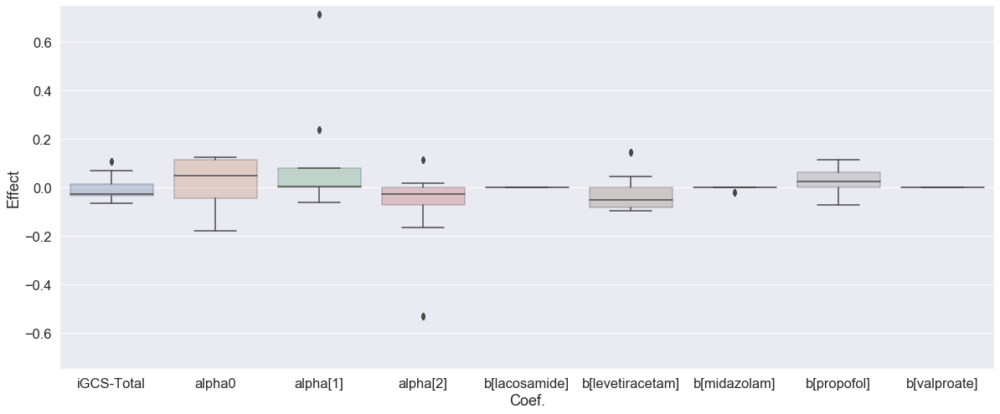

In [16]:
idxs = mg.sum(axis=1).loc[mg.sum(axis=1)>10].index

df_coef = pd.DataFrame()
for idx in idxs:
    T_neighbors = T.loc[mg.loc[idx][mg.loc[idx]>0].index]
    Y_neighbors = Y.loc[mg.loc[idx][mg.loc[idx]>0].index]
    model = lm.RidgeClassifierCV().fit(T_neighbors,Y_neighbors)
    coef = pd.DataFrame(model.coef_.reshape(1,-1),index=[idx],columns=T.columns)
    df_coef = pd.concat([df_coef,coef])
fig,ax = plt.subplots(figsize=(20,8))
# df_coef.plot(kind='box',ax=ax)
df_coef_melt = df_coef.drop(columns=[]).melt(var_name='Coef.', value_name='Effect')
sns.boxplot(x="Coef.", y="Effect", data=df_coef_melt,boxprops=dict(alpha=.3))
plt.ylim((-0.75,0.75))
# plt.plot(np.arange(1,9),df_coef.mean(axis=0))

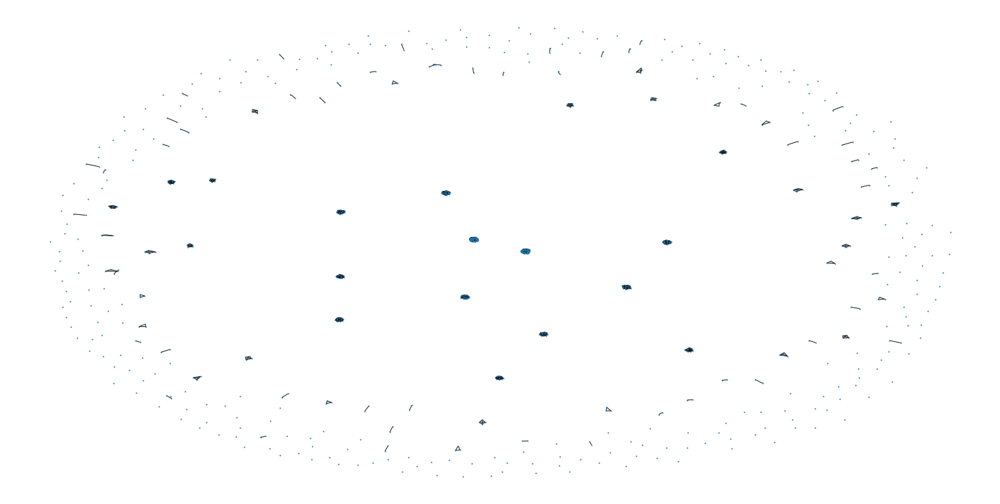

In [17]:
G = nx.from_pandas_adjacency(mg)
fig = plt.figure(figsize=(20,10))
nx.draw_spring(G,node_size=1)

In [18]:
from pyvis.network import Network

In [19]:
nt = Network(height=700,width=800,notebook=True)
nt.from_nx(G)
nt.show('G.html')

# Part-5 Descriptive Statistics 

In [11]:
import time

In [3]:
df_cov_full = pd.read_csv('/Users/harshparikh/IIC/step1_output/covariates-full.csv',index_col=0)
df_cov_full.head()

,Gender,Age,The start day of first EEG,Total EEG,Date of admission,Date of discharge,marrital status unmarried (if the pt was divorced or is widow is still in this category)=0 married=1,iGCS-Total,iGCS = T? no=0 yes=1,iGCS-E,...,HAI-Cdiff No=0 Yes=1,DVT No=0 Yes=1,"New trach (Date) DC summary, QPID, no need=0, if yes= mention the date","New Peg (Date) DC summary, QPID","Tx hypothermia (induced hypothermia or therapeutic hypothermia), DC SUMMARY, QPID No=0 Yes=1",Final Neuro Dx ischemic stroke =1 hemorrhagic stroke=2 SAH=3 SDH=4 SDH+other TBI (including SAH)=5 Other TBI (including SAH)=6 Seizures/status epilepticus=7 Brain tumor/primary or mets=8 CNS infection/inflammation=9 Hypoxic ischemic encephalopathy/Anoxic brain injury=10 Toxic metabolic encephalopathy=11 Other neurosurgical (non tumor/trauma) (eg EVD/VPS etc)=12 Primary psychiatric disorder=13 Other structural-degenerative diseases=18 Spells=19,"Primary systemic Dx none=0 Respiratory disorders=1 cardiovascular disorders=2 Renal failure=3 Liver disorders=4 Gastrointestinal non-hemorrhagic=5 Genitourinary=6 Systemic hemorrhage=7 Endocrine emergency=8 Non head trauma (including spine)=9 Malignancy (solid tumors/hematologic)=10 Other post operative (eg CT surgery, transplant)=11 Primary hematological disorder=12 Immunological=13 Dermatological/Musculoskeletal=14",Primary systemic dx Sepsis/Shock No=0 Yes=1,External Ventricular Drain (EVD) No=0 Yes=1,BOLT N0=0 Yes=1
Index,,,,,,,,,,,,,,,,,,,,,
sid1,F,19.93,2015-07-15 16:37:00,66.64,2015-07-14 00:00:00,2015-07-18 00:00:00,0.0,11,0,4,...,0,0,NaN,NaN,NaN,19,"2,14",0,0,0
sid2,F,85.01,2015-07-14 13:07:00,40.72,2015-07-03 00:00:00,2015-08-05 00:00:00,0.0,7,0,1,...,0,0,2015-07-07 00:00:00,2015-07-07 00:00:00,NaN,2,"1,2",0,1,0
sid3,M,45.91,2015-07-14 13:05:00,46.66,2015-07-12 00:00:00,2015-09-14 00:00:00,1.0,8,0,3,...,0,0,NaN,NaN,NaN,10,"1,14",0,0,0
sid4,M,53.99,2015-07-13 11:56:00,26.63,2015-07-10 00:00:00,2015-07-24 00:00:00,1.0,4,0,1,...,0,0,NaN,NaN,NaN,4,"1,9",0,1,1
sid5,M,23.08,2015-07-08 03:51:00,32.97,2015-07-07 00:00:00,2015-07-13 00:00:00,0.0,6,1,1,...,0,0,NaN,NaN,NaN,"7,13",0,0,0,0


<AxesSubplot:>

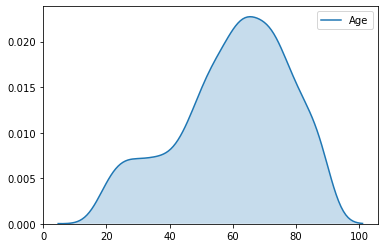

In [4]:
sns.kdeplot(df_cov_full['Age'],shade=True)

<AxesSubplot:xlabel='Gender', ylabel='count'>

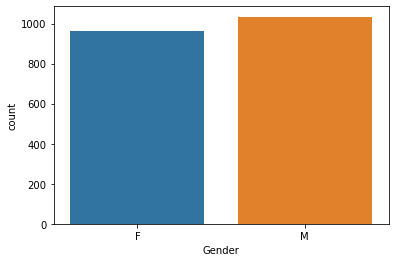

In [6]:
sns.countplot(df_cov_full['Gender'])

In [13]:
df_cov_full['Date of admission '] = pd.to_datetime(df_cov_full['Date of admission '], format='%Y-%m-%d %H:%M:%S')
df_cov_full['Date of discharge'] = pd.to_datetime(df_cov_full['Date of discharge'], format='%Y-%m-%d %H:%M:%S')
df_cov_full['The start day of first EEG'] = pd.to_datetime(df_cov_full['The start day of first EEG'])

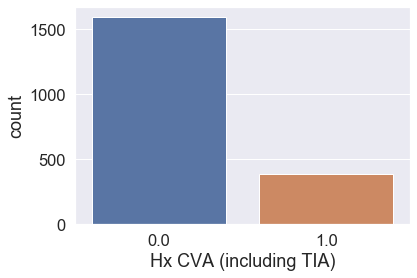

In [11]:
sns.countplot(covariates['Hx CVA (including TIA)'])

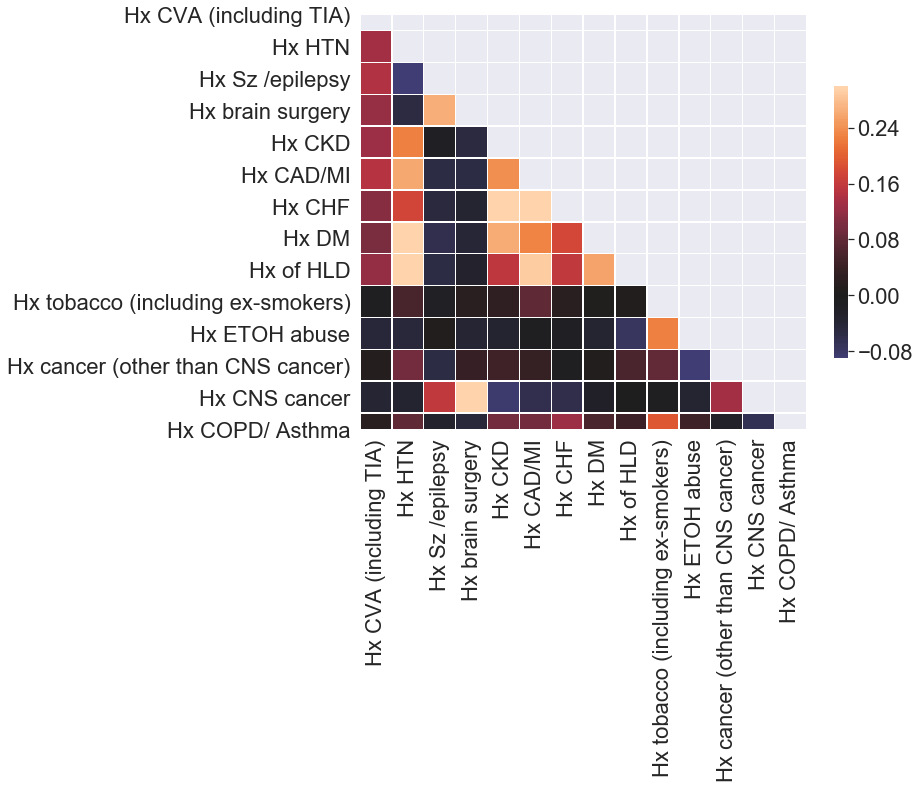

In [273]:
X = covariates[['Hx CVA (including TIA)', 'Hx HTN', 'Hx Sz /epilepsy',
       'Hx brain surgery', 'Hx CKD', 'Hx CAD/MI', 'Hx CHF', 'Hx DM',
       'Hx of HLD', 'Hx tobacco (including ex-smokers)',
       'Hx ETOH abuse any time in their life (just when in the hx is mentioned)',
       'Hx cancer (other than CNS cancer)', 'Hx CNS cancer', 'Hx COPD/ Asthma']].rename(columns={'Hx ETOH abuse any time in their life (just when in the hx is mentioned)':'Hx ETOH abuse'})
corr = X.corr()
mask = np.triu(np.ones_like(corr, dtype=bool))
f, ax = plt.subplots(figsize=(10, 10))
sns.heatmap(corr, mask=mask, vmax=.3, center=0,
            square=True, linewidths=.5, cbar_kws={"shrink": .5})

In [14]:
df_cov_full['Length of Stay'] = df_cov_full['Date of discharge'] - df_cov_full['Date of admission '] 
df_cov_full['Time Before EEG'] =  df_cov_full['The start day of first EEG'] - df_cov_full['Date of admission '] 

Index
sid1        4 days
sid2       33 days
sid3       64 days
sid4       14 days
sid5        6 days
            ...   
sid1996    10 days
sid1997    17 days
sid1998    11 days
sid1999    40 days
sid2000   118 days
Name: Length of Stay, Length: 1999, dtype: timedelta64[ns]

In [1]:




#

# Effect of IIC on Y

In [265]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
np.random.seed(0)
sns.set()

In [330]:
Y= pd.read_csv('/home/kentaro/Dropbox/outcomes.csv', index_col = 0)
C = pd.read_csv('/home/kentaro/Dropbox/covariates-full.csv',index_col=0)

thetas = pd.read_csv('/home/kentaro/github/iic_causal_inference/aim1/step6_simulator/results_iic_burden_smooth/params_mean_CNNIIC_iic_burden_smooth_cauchy_expit_lognormal_drugoutside_ARMA2,6_iter1000.csv',index_col=0)
#thetas = pd.read_csv('/Users/harshparikh/Documents/GitHub/iic_causal_inference/aim1/step4_simulator/results/params_CNNIIC_cauchy_expit_lognormal_drugoutside_ARMA2,6_iter1000.csv',index_col=0)
thetas = thetas.fillna(0)
theta_prime = (thetas[['b[lacosamide]', 'b[levetiracetam]', 'b[midazolam]', 'b[pentobarbital]','b[phenobarbital]', 'b[propofol]','b[valproate]']]>0.001).astype(int).rename(columns={name:name+'_given' for name in ['b[lacosamide]', 'b[levetiracetam]', 'b[midazolam]', 'b[pentobarbital]','b[phenobarbital]', 'b[propofol]','b[valproate]']})
thetas = thetas[['cluster','maxD','maxE','alpha0', 'alpha[1]', 'alpha[2]',
        'b[lacosamide]', 'b[levetiracetam]', 'b[midazolam]', 'b[propofol]', 'b[valproate]', 
        'Gender', 'Age',
       'marrital', 'Hx CVA (including TIA)', 'Hx HTN',
       'Hx Sz /epilepsy', 'Hx brain surgery', 'Hx CKD', 'Hx CAD/MI', 'Hx CHF',
       'Hx DM', 'Hx of HLD', 'Hx tobacco (including ex-smokers)',
       'Hx cancer (other than CNS cancer)', 'Hx CNS cancer', 'Hx COPD/ Asthma',
       'hydrocephalus  (either on admission or during hospital course)   QPID',
       'iMV  (initial (on admission) mechanical ventilation)',
       'Primary systemic dx Sepsis/Shock', 'iGCS-Total',
       'neuro_dx_Seizures/status epilepticus',
       'prim_dx_Respiratory disorders']].fillna(0)

#remove patients wo/eeg
Y = (Y[['DC MRS (modified ranking scale)']].loc[list(thetas.index)])

#impute one missing value as 4
Y[Y.values == 'na'] = 4
Y = Y.fillna(4)
Y = Y.astype(int)

C = (C.loc[list(thetas.index)])




In [331]:
thetas

,cluster,maxD,maxE,alpha0,alpha[1],alpha[2],b[lacosamide],b[levetiracetam],b[midazolam],b[propofol],...,Hx tobacco (including ex-smokers),Hx cancer (other than CNS cancer),Hx CNS cancer,Hx COPD/ Asthma,hydrocephalus (either on admission or during hospital course) QPID,iMV (initial (on admission) mechanical ventilation),Primary systemic dx Sepsis/Shock,iGCS-Total,neuro_dx_Seizures/status epilepticus,prim_dx_Respiratory disorders
SID,,,,,,,,,,,,,,,,,,,,,
sid2,1,128.645486,1.000000,0.332172,0.497090,0.045100,0.00000,0.008682,0.0,0.000000,...,0.0,0.0,0.0,1.0,1,0,0,7,0,1
sid3,10,107.551461,1.000000,0.583871,0.493105,0.111527,0.00000,0.966040,0.0,0.000000,...,1.0,0.0,0.0,0.0,0,1,0,8,0,1
sid4,8,36.814206,1.000000,0.188013,0.155239,0.491172,0.00000,0.010657,0.0,0.039377,...,0.0,0.0,0.0,0.0,0,0,0,4,0,1
sid5,11,20.451070,0.412371,-5.580504,-0.013525,-0.015951,6.58228,0.000000,0.0,2.554616,...,1.0,0.0,0.0,0.0,0,1,0,6,1,0
sid6,4,0.000000,1.000000,0.293477,0.498598,-0.072789,0.00000,0.000000,0.0,0.000000,...,0.0,0.0,0.0,0.0,0,0,0,14,1,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
sid1989,5,87.507316,0.916667,-1.004246,0.274695,0.074744,0.00000,0.022612,0.0,0.000000,...,0.0,1.0,1.0,0.0,0,0,0,15,1,0
sid1990,4,109.666207,1.000000,0.073480,-0.050963,0.434934,0.00000,0.009184,0.0,0.000000,...,1.0,1.0,1.0,0.0,0,0,0,15,0,0
sid1991,7,148.092686,1.000000,-0.027244,0.103983,0.479641,0.00000,0.005043,0.0,0.044960,...,0.0,0.0,0.0,0.0,0,0,0,15,0,0


In [333]:
combine_df = Y.join(thetas, how='outer')
combine_df.head()

combine_df2 = combine_df.iloc[:,:]
combine_df2.head()
combine_df2['DC MRS (modified ranking scale)']

sid2       5
sid3       6
sid4       6
sid5       2
sid6       1
          ..
sid1989    3
sid1990    3
sid1991    4
sid1997    4
sid1999    4
Name: DC MRS (modified ranking scale), Length: 1310, dtype: int64

In [334]:
combine_df2.dtypes

DC MRS (modified ranking scale)                                            int64
cluster                                                                    int64
maxD                                                                     float64
maxE                                                                     float64
alpha0                                                                   float64
alpha[1]                                                                 float64
alpha[2]                                                                 float64
b[lacosamide]                                                            float64
b[levetiracetam]                                                         float64
b[midazolam]                                                             float64
b[propofol]                                                              float64
b[valproate]                                                             float64
Gender                      

<AxesSubplot:xlabel='DC MRS (modified ranking scale)', ylabel='count'>

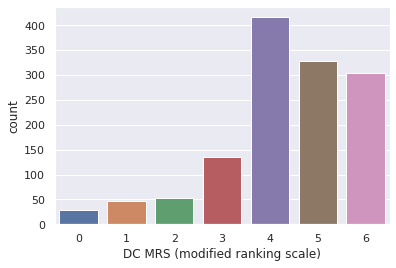

In [335]:
sns.countplot(combine_df2['DC MRS (modified ranking scale)'])

<AxesSubplot:xlabel='maxE', ylabel='Count'>

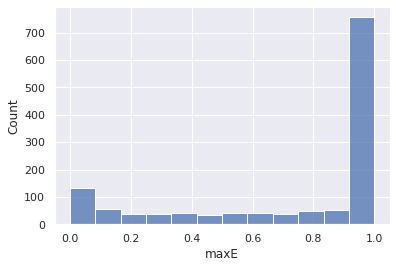

In [336]:
sns.histplot(combine_df2['maxE'])

<AxesSubplot:xlabel='alpha0', ylabel='maxE'>

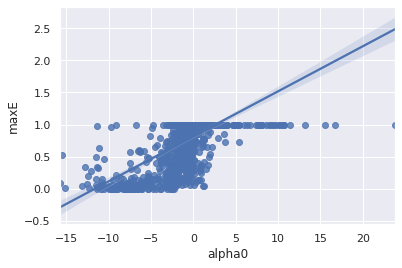

In [337]:
sns.regplot(x = 'alpha0', y = 'maxE',data = combine_df2)

In [338]:
#combine_df2['binalpha0'] = combine_df2['alpha0'] >= 0
#combine_df2  = combine_df2.drop(columns = ['alpha0', 'maxE'])
#sns.countplot(combine_df2['binalpha0'])

<AxesSubplot:xlabel='binmaxE', ylabel='count'>

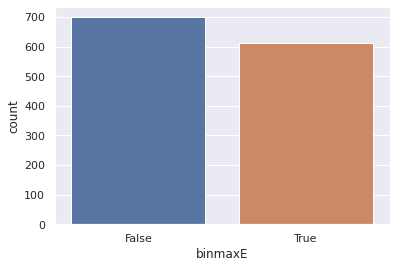

In [339]:
combine_df2['binmaxE'] = combine_df2['maxE'] <1
combine_df2  = combine_df2.drop(columns = ['alpha0', 'maxE'])
sns.countplot(combine_df2['binmaxE'])

In [340]:
combine_df2['DC MRS (modified ranking scale)']=combine_df2['DC MRS (modified ranking scale)'].replace(0,1)
combine_df2['DC MRS (modified ranking scale)']=combine_df2['DC MRS (modified ranking scale)'].replace(1,0.91)
combine_df2['DC MRS (modified ranking scale)']=combine_df2['DC MRS (modified ranking scale)'].replace(2,0.76)
combine_df2['DC MRS (modified ranking scale)']=combine_df2['DC MRS (modified ranking scale)'].replace(3,0.65)
combine_df2['DC MRS (modified ranking scale)']=combine_df2['DC MRS (modified ranking scale)'].replace(4,0.33)
combine_df2['DC MRS (modified ranking scale)']=combine_df2['DC MRS (modified ranking scale)'].replace(5,0)
combine_df2['DC MRS (modified ranking scale)']=combine_df2['DC MRS (modified ranking scale)'].replace(6,0)

combine_df2
#combine_df2['DC MRS (modified ranking scale)'] = combine_df2['DC MRS (modified ranking scale)'] <= 3

,DC MRS (modified ranking scale),cluster,maxD,alpha[1],alpha[2],b[lacosamide],b[levetiracetam],b[midazolam],b[propofol],b[valproate],...,Hx cancer (other than CNS cancer),Hx CNS cancer,Hx COPD/ Asthma,hydrocephalus (either on admission or during hospital course) QPID,iMV (initial (on admission) mechanical ventilation),Primary systemic dx Sepsis/Shock,iGCS-Total,neuro_dx_Seizures/status epilepticus,prim_dx_Respiratory disorders,binmaxE
sid2,0.00,1,128.645486,0.497090,0.045100,0.00000,0.008682,0.0,0.000000,0.0,...,0.0,0.0,1.0,1,0,0,7,0,1,False
sid3,0.00,10,107.551461,0.493105,0.111527,0.00000,0.966040,0.0,0.000000,0.0,...,0.0,0.0,0.0,0,1,0,8,0,1,False
sid4,0.00,8,36.814206,0.155239,0.491172,0.00000,0.010657,0.0,0.039377,0.0,...,0.0,0.0,0.0,0,0,0,4,0,1,False
sid5,0.76,11,20.451070,-0.013525,-0.015951,6.58228,0.000000,0.0,2.554616,0.0,...,0.0,0.0,0.0,0,1,0,6,1,0,True
sid6,0.91,4,0.000000,0.498598,-0.072789,0.00000,0.000000,0.0,0.000000,0.0,...,0.0,0.0,0.0,0,0,0,14,1,0,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
sid1989,0.65,5,87.507316,0.274695,0.074744,0.00000,0.022612,0.0,0.000000,0.0,...,1.0,1.0,0.0,0,0,0,15,1,0,True
sid1990,0.65,4,109.666207,-0.050963,0.434934,0.00000,0.009184,0.0,0.000000,0.0,...,1.0,1.0,0.0,0,0,0,15,0,0,False
sid1991,0.33,7,148.092686,0.103983,0.479641,0.00000,0.005043,0.0,0.044960,0.0,...,0.0,0.0,0.0,0,0,0,15,0,0,False
sid1997,0.33,8,0.000000,0.193813,0.133606,0.00000,0.000000,0.0,0.000000,0.0,...,0.0,0.0,0.0,0,1,1,3,1,0,True


In [341]:
type(combine_df2['DC MRS (modified ranking scale)'])

pandas.core.series.Series

In [342]:
combine_df2

,DC MRS (modified ranking scale),cluster,maxD,alpha[1],alpha[2],b[lacosamide],b[levetiracetam],b[midazolam],b[propofol],b[valproate],...,Hx cancer (other than CNS cancer),Hx CNS cancer,Hx COPD/ Asthma,hydrocephalus (either on admission or during hospital course) QPID,iMV (initial (on admission) mechanical ventilation),Primary systemic dx Sepsis/Shock,iGCS-Total,neuro_dx_Seizures/status epilepticus,prim_dx_Respiratory disorders,binmaxE
sid2,0.00,1,128.645486,0.497090,0.045100,0.00000,0.008682,0.0,0.000000,0.0,...,0.0,0.0,1.0,1,0,0,7,0,1,False
sid3,0.00,10,107.551461,0.493105,0.111527,0.00000,0.966040,0.0,0.000000,0.0,...,0.0,0.0,0.0,0,1,0,8,0,1,False
sid4,0.00,8,36.814206,0.155239,0.491172,0.00000,0.010657,0.0,0.039377,0.0,...,0.0,0.0,0.0,0,0,0,4,0,1,False
sid5,0.76,11,20.451070,-0.013525,-0.015951,6.58228,0.000000,0.0,2.554616,0.0,...,0.0,0.0,0.0,0,1,0,6,1,0,True
sid6,0.91,4,0.000000,0.498598,-0.072789,0.00000,0.000000,0.0,0.000000,0.0,...,0.0,0.0,0.0,0,0,0,14,1,0,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
sid1989,0.65,5,87.507316,0.274695,0.074744,0.00000,0.022612,0.0,0.000000,0.0,...,1.0,1.0,0.0,0,0,0,15,1,0,True
sid1990,0.65,4,109.666207,-0.050963,0.434934,0.00000,0.009184,0.0,0.000000,0.0,...,1.0,1.0,0.0,0,0,0,15,0,0,False
sid1991,0.33,7,148.092686,0.103983,0.479641,0.00000,0.005043,0.0,0.044960,0.0,...,0.0,0.0,0.0,0,0,0,15,0,0,False
sid1997,0.33,8,0.000000,0.193813,0.133606,0.00000,0.000000,0.0,0.000000,0.0,...,0.0,0.0,0.0,0,1,1,3,1,0,True


In [343]:
combine_df2.columns

Index(['DC MRS (modified ranking scale)', 'cluster', 'maxD', 'alpha[1]',
       'alpha[2]', 'b[lacosamide]', 'b[levetiracetam]', 'b[midazolam]',
       'b[propofol]', 'b[valproate]', 'Gender', 'Age', 'marrital',
       'Hx CVA (including TIA)', 'Hx HTN', 'Hx Sz /epilepsy',
       'Hx brain surgery', 'Hx CKD', 'Hx CAD/MI', 'Hx CHF', 'Hx DM',
       'Hx of HLD', 'Hx tobacco (including ex-smokers)',
       'Hx cancer (other than CNS cancer)', 'Hx CNS cancer', 'Hx COPD/ Asthma',
       'hydrocephalus  (either on admission or during hospital course)   QPID',
       'iMV  (initial (on admission) mechanical ventilation)',
       'Primary systemic dx Sepsis/Shock', 'iGCS-Total',
       'neuro_dx_Seizures/status epilepticus', 'prim_dx_Respiratory disorders',
       'binmaxE'],
      dtype='object')

In [344]:
#dummification is needed for linear regression\

#discretization is necessary regardless of esatimtor type
discrete_variables = combine_df2.columns
discrete_variables = discrete_variables.drop(['maxD','DC MRS (modified ranking scale)', 'alpha[1]', 'alpha[2]', 'b[lacosamide]', 'b[levetiracetam]', 
                                              'b[midazolam]', 'b[propofol]', 'b[valproate]', 'Age', 'iGCS-Total', 'binmaxE']).tolist()
discrete_variables

['cluster',
 'Gender',
 'marrital',
 'Hx CVA (including TIA)',
 'Hx HTN',
 'Hx Sz /epilepsy',
 'Hx brain surgery',
 'Hx CKD',
 'Hx CAD/MI',
 'Hx CHF',
 'Hx DM',
 'Hx of HLD',
 'Hx tobacco (including ex-smokers)',
 'Hx cancer (other than CNS cancer)',
 'Hx CNS cancer',
 'Hx COPD/ Asthma',
 'hydrocephalus  (either on admission or during hospital course)   QPID',
 'iMV  (initial (on admission) mechanical ventilation)',
 'Primary systemic dx Sepsis/Shock',
 'neuro_dx_Seizures/status epilepticus',
 'prim_dx_Respiratory disorders']

In [345]:
m = pymalts.malts_mf( outcome='DC MRS (modified ranking scale)', treatment='binmaxE', data=combine_df2,output_format='full', k_est= 35, k_tr = 35, discrete = discrete_variables, estimator = 'mean')# running MALTS with default setting

KeyboardInterrupt: 

In [17]:
m.MG_matrix

,sid2,sid3,sid4,sid5,sid6,sid7,sid8,sid9,sid12,sid15,...,sid1981,sid1983,sid1984,sid1985,sid1986,sid1989,sid1990,sid1991,sid1997,sid1999
sid2,4.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,3.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
sid3,0.0,4.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,2.0,...,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0
sid4,0.0,0.0,4.0,0.0,0.0,0.0,0.0,0.0,0.0,2.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,2.0,0.0
sid5,0.0,0.0,0.0,4.0,1.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0
sid6,0.0,0.0,0.0,1.0,4.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
sid1989,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,...,0.0,0.0,0.0,0.0,3.0,4.0,0.0,0.0,0.0,0.0
sid1990,0.0,0.0,0.0,0.0,2.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,4.0,0.0,0.0,0.0
sid1991,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,4.0,0.0,0.0,0.0,0.0,0.0,4.0,0.0,0.0
sid1997,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,4.0,0.0


In [18]:
type(m)

pymalts.malts_mf

In [19]:
pd.concat(m.M_opt_list).mean(axis = 0).sort_values() 

maxD                                                                     0.194637
Hx cancer (other than CNS cancer)                                        0.492129
cluster                                                                  0.605628
iMV  (initial (on admission) mechanical ventilation)                     0.607773
b[midazolam]                                                             0.696318
prim_dx_Respiratory disorders                                            0.697249
b[lacosamide]                                                            0.704126
Gender                                                                   0.705867
neuro_dx_Seizures/status epilepticus                                     0.706025
hydrocephalus  (either on admission or during hospital course)   QPID    0.715672
Primary systemic dx Sepsis/Shock                                         0.721592
Hx CHF                                                                   0.730229
Hx CVA (includin

In [20]:
fig = plt.figure(figsize=(10,10))
sns.heatmap(m.MG_matrix)

NameError: name 'plt' is not defined

<AxesSubplot:ylabel='Density'>

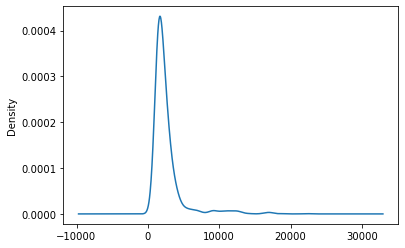

In [21]:
m.CATE_df['avg.Diameter'].plot(kind = 'kde')

In [22]:
#matched group differences of means of covairates (compare centroids)
#diameter is max dist of units in a matched group (compare max distances)


In [23]:
m.CATE_df.mean(axis=0)['CATE'].std()

0.08733830579435085

<AxesSubplot:ylabel='Density'>

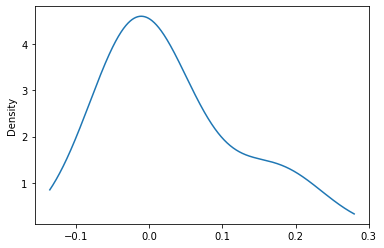

In [24]:
m.CATE_df.mean(axis=0)['CATE'].plot(kind = 'kde')

CATE   -0.028871
CATE    0.176036
CATE   -0.031816
CATE    0.039149
CATE   -0.012759
dtype: float64

In [25]:
## tau_i = TE for unit i
## \sum_i (tau_i - \bar{tau}) ^2
ATE = m.CATE_df['avg.CATE'].std()
ATE

0.09065912760283965

In [26]:
ATE = m.CATE_df['avg.CATE'].mean()
ATE

0.028347873500545236

<AxesSubplot:ylabel='Density'>

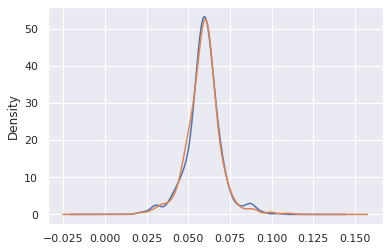

In [302]:
m.CATE_df.loc[combine_df2['binmaxE'] == True,'avg.CATE'].plot(kind ='kde')
m.CATE_df.loc[combine_df2['binmaxE'] == False,'avg.CATE'].plot(kind ='kde')

In [303]:
print(type(m.CATE_df))

<class 'pandas.core.frame.DataFrame'>


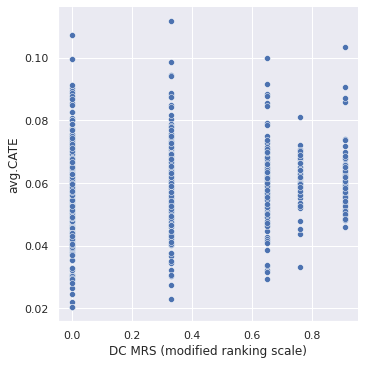

In [304]:
sns.relplot(
    y='avg.CATE', x='DC MRS (modified ranking scale)', data= m.CATE_df
)

,CATE,CATE,CATE,CATE,CATE,avg.CATE,std.CATE,DC MRS (modified ranking scale),binmaxE,avg.Diameter,std.gbr.CATE,avg.gbr.CATE
sid2,0.020857,0.013714,0.108857,NaN,0.004286,0.055567,0.025977,0.00,0.0,264.131501,0.025977,0.055567
sid3,-0.020000,0.121429,-0.000857,NaN,0.206286,0.059722,0.027358,0.00,0.0,189.010242,0.027358,0.059722
sid5,0.151714,0.115714,0.044000,NaN,0.103429,0.070875,0.026529,0.76,1.0,184.046469,0.026529,0.070875
sid6,0.140000,0.068000,0.044571,NaN,0.050286,0.059649,0.028359,0.91,0.0,33.012063,0.028359,0.059649
sid8,-0.073714,NaN,-0.025429,0.038000,0.050000,0.043887,0.029023,0.33,0.0,202.372877,0.029023,0.043887
...,...,...,...,...,...,...,...,...,...,...,...,...
sid1950,NaN,-0.068571,0.019714,-0.024571,0.002000,0.062015,0.027027,0.33,1.0,22.044811,0.027027,0.062015
sid1953,NaN,0.130571,-0.038286,0.060000,0.109429,0.052660,0.027707,0.33,1.0,25.577737,0.027707,0.052660
sid1968,NaN,0.047143,0.088857,0.026571,0.006857,0.066839,0.025844,0.00,0.0,95.175568,0.025844,0.066839
sid1972,NaN,0.018286,0.070000,-0.044857,0.036857,0.059640,0.027089,0.00,0.0,437.641058,0.027089,0.059640


<AxesSubplot:xlabel='DC MRS (modified ranking scale)', ylabel='avg.CATE'>

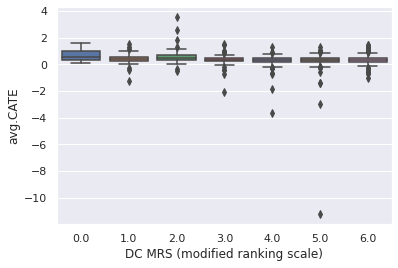

In [171]:
sns.boxplot(y='avg.CATE', x='DC MRS (modified ranking scale)', data= m.CATE_df)

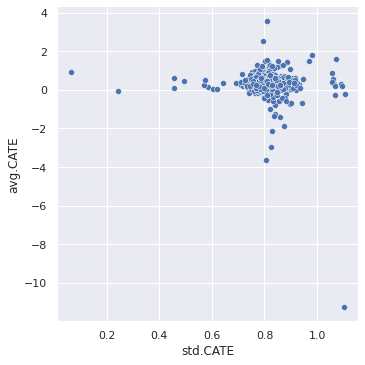

In [173]:
sns.relplot(
    y='avg.CATE', x='std.CATE', data= m.CATE_df
)

Text(-3.679592244756469, 0.04, '$\\hat{ATE}$')

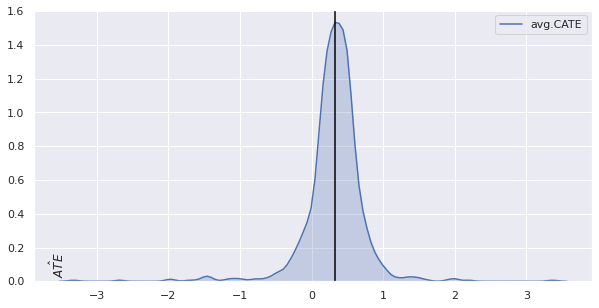

In [293]:
fig = plt.figure(figsize=(10,5))
sns.kdeplot(m.CATE_df['avg.CATE'],shade=True)
plt.axvline(ATE,c='black')
plt.text(ATE-4,0.04,'$\hat{ATE}$',rotation=90)

In [ ]:
import sys
sys.path.insert(1,'/home/kentaro/github/iic_causal_inference/MALTS')
import pymalts 
import numpy as np
import pandas as pd
import pickle

Cutoff = np.linspace(0.2,1,9,endpoint=True)
ordinal_malts_list = []
utility_malts_list = []

ordinal_mean = []
utility_mean = []
ordinal_std = []
utility_std = []



Y= pd.read_csv('/home/kentaro/Dropbox/outcomes.csv', index_col = 0)
C = pd.read_csv('/home/kentaro/Dropbox/covariates-full.csv',index_col=0)

thetas = pd.read_csv('/home/kentaro/github/iic_causal_inference/aim1/step6_simulator/results_iic_burden_smooth/params_mean_CNNIIC_iic_burden_smooth_cauchy_expit_lognormal_drugoutside_ARMA2,6_iter1000.csv',index_col=0)
    #thetas = pd.read_csv('/Users/harshparikh/Documents/GitHub/iic_causal_inference/aim1/step4_simulator/results/params_CNNIIC_cauchy_expit_lognormal_drugoutside_ARMA2,6_iter1000.csv',index_col=0)
thetas = thetas.fillna(0)
theta_prime = (thetas[['b[lacosamide]', 'b[levetiracetam]', 'b[midazolam]', 'b[pentobarbital]','b[phenobarbital]', 'b[propofol]','b[valproate]']]>0.001).astype(int).rename(columns={name:name+'_given' for name in ['b[lacosamide]', 'b[levetiracetam]', 'b[midazolam]', 'b[pentobarbital]','b[phenobarbital]', 'b[propofol]','b[valproate]']})
thetas = thetas[['cluster','maxD','maxE','alpha0', 'alpha[1]', 'alpha[2]',
            'b[lacosamide]', 'b[levetiracetam]', 'b[midazolam]', 'b[propofol]', 'b[valproate]', 
            'Gender', 'Age',
           'marrital', 'Hx CVA (including TIA)', 'Hx HTN',
           'Hx Sz /epilepsy', 'Hx brain surgery', 'Hx CKD', 'Hx CAD/MI', 'Hx CHF',
           'Hx DM', 'Hx of HLD', 'Hx tobacco (including ex-smokers)',
           'Hx cancer (other than CNS cancer)', 'Hx CNS cancer', 'Hx COPD/ Asthma',
           'hydrocephalus  (either on admission or during hospital course)   QPID',
           'iMV  (initial (on admission) mechanical ventilation)',
           'Primary systemic dx Sepsis/Shock', 'iGCS-Total',
           'neuro_dx_Seizures/status epilepticus',
           'prim_dx_Respiratory disorders']].fillna(0)

    #remove patients wo/eeg
Y = (Y[['DC MRS (modified ranking scale)']].loc[list(thetas.index)])

    #impute one missing value as 4
Y[Y.values == 'na'] = 4
Y = Y.fillna(4)
Y = Y.astype(int)

C = (C.loc[list(thetas.index)])

combine_df = Y.join(thetas, how='outer')
combine_df.head()



for i in range(0,len(Cutoff)):
#for i in range(0,2):
    
    print('=============================')
    print(Cutoff[i])
    
    #first we do the ordinal
    combine_df2 = combine_df
    combine_df2['binmaxE'] = combine_df2['maxE'] <Cutoff[i]
    combine_df2  = combine_df2.drop(columns = ['alpha0', 'maxE'])
    
    discrete_variables = combine_df2.columns
    discrete_variables = discrete_variables.drop(['maxD','DC MRS (modified ranking scale)', 'alpha[1]', 'alpha[2]', 'b[lacosamide]', 'b[levetiracetam]', 
                                                  'b[midazolam]', 'b[propofol]', 'b[valproate]', 'Age', 'iGCS-Total', 'binmaxE']).tolist()
    
    combine_df2['DC MRS (modified ranking scale)'] = combine_df2['DC MRS (modified ranking scale)'] <= 3
    
    m = pymalts.malts_mf( outcome='DC MRS (modified ranking scale)', treatment='binmaxE', data=combine_df2,output_format='full',
                          k_est= 35, k_tr = 35, discrete = discrete_variables, n_repeats=10,estimator = 'mean', reweight = True)
    
    
    ordinal_malts_list.append(m)
    
    std = m.CATE_df.mean(axis=0)['CATE'].std()
    ATE = m.CATE_df['avg.CATE'].mean()
    ordinal_std.append(std)
    ordinal_mean.append(ATE)
    print(ATE)
    print(std)
    
    
    
    
    #then we do the utility
    combine_df2 = combine_df
    combine_df2['binmaxE'] = combine_df2['maxE'] <Cutoff[i]
    combine_df2  = combine_df2.drop(columns = ['alpha0', 'maxE'])
    
    discrete_variables = combine_df2.columns
    discrete_variables = discrete_variables.drop(['maxD','DC MRS (modified ranking scale)', 'alpha[1]', 'alpha[2]', 'b[lacosamide]', 'b[levetiracetam]', 
                                                  'b[midazolam]', 'b[propofol]', 'b[valproate]', 'Age', 'iGCS-Total', 'binmaxE']).tolist()
    combine_df2['DC MRS (modified ranking scale)']=combine_df2['DC MRS (modified ranking scale)'].replace(0,1)
    combine_df2['DC MRS (modified ranking scale)']=combine_df2['DC MRS (modified ranking scale)'].replace(1,0.91)
    combine_df2['DC MRS (modified ranking scale)']=combine_df2['DC MRS (modified ranking scale)'].replace(2,0.76)
    combine_df2['DC MRS (modified ranking scale)']=combine_df2['DC MRS (modified ranking scale)'].replace(3,0.65)
    combine_df2['DC MRS (modified ranking scale)']=combine_df2['DC MRS (modified ranking scale)'].replace(4,0.33)
    combine_df2['DC MRS (modified ranking scale)']=combine_df2['DC MRS (modified ranking scale)'].replace(5,0)
    combine_df2['DC MRS (modified ranking scale)']=combine_df2['DC MRS (modified ranking scale)'].replace(6,0)

    m = pymalts.malts_mf( outcome='DC MRS (modified ranking scale)', treatment='binmaxE', data=combine_df2,output_format='full',
                          k_est= 35, k_tr = 35, discrete = discrete_variables, n_repeats=10,estimator = 'mean', reweight=True)
    
    utility_malts_list.append(m)
    
    std = m.CATE_df.mean(axis=0)['CATE'].std()
    ATE = m.CATE_df['avg.CATE'].mean()
    utility_std.append(std)
    utility_mean.append(ATE)
    print(ATE)
    print(std)
    

results_dict = {'Cutoff':Cutoff, 'ordinal_malts_list':ordinal_malts_list, 'utility_malts_list':utility_malts_list }

pickle.dump(results_dict, open("/home/kentaro/github/iic_causal_inference/aim1/cutoff_ATE.p", "wb"))  # save it into a file named save.p

    

0.2
0.032362050163576864
0.029781501154751557
-0.006999438386041442
0.0172274170386571
0.30000000000000004
0.03144220283533254
0.028249373774282105
-0.008714601962922567
0.018504750283813577
0.4
0.035697382769901746
0.021940493855430506
0.005734367502726275
0.01629182584854588
0.5
0.07934950926935672
0.019341957764066484
0.04183208287895306
0.01594966932207036
0.6000000000000001
0.0817589967284625
0.02029549635498329
0.042624482006543105
0.011983858765515092
0.7
0.08985932388222453
0.020745095303875537
0.05430522900763364
0.012574334064760643
0.8
0.09748473282442746
0.0147657720634157
0.06525209378407856
0.01260211113661816
0.9000000000000001
0.09640130861504906
0.014816133047248894
0.06977943838604139
0.012480047467161061
1.0
0.0986832061068703
0.014465973317748789
0.06204875681570333
0.009082240474634178


In [ ]:
##notes to self
# can we see which variables start going away as we decrease teh cutoff? (so our treatmetn effect goes away, but which variables are causing thsi?)

In [29]:
ordinal_malts_list

In [37]:
import pickle


In [38]:

favorite_color = pickle.load(open("save.p", "rb"))

In [41]:
favorite_color['Cutoff']

array([0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9, 1. ])

In [294]:
#remove those with low stretch coefficeint
pd.concat(m.M_opt_list).mean(axis = 0).sort_values()  

Hx CAD/MI                                                                0.613953
Hx CNS cancer                                                            0.636238
systolic BP                                                              0.637579
Hx tobacco (including ex-smokers)                                        0.702706
hydrocephalus  (either on admission or during hospital course)   QPID    0.702902
Primary systemic dx Sepsis/Shock                                         0.707134
Age                                                                      0.714892
Hx CVA (including TIA)                                                   0.764177
alpha[1]                                                                 0.769060
b[midazolam]                                                             0.770028
Hx CHF                                                                   0.771882
neuro_dx_Seizures/status epilepticus                                     0.772706
Hx CKD          

In [295]:
pd.concat(m.M_opt_list).mean(axis = 0).sort_values()  >=0.84

Hx CAD/MI                                                                False
Hx CNS cancer                                                            False
systolic BP                                                              False
Hx tobacco (including ex-smokers)                                        False
hydrocephalus  (either on admission or during hospital course)   QPID    False
Primary systemic dx Sepsis/Shock                                         False
Age                                                                      False
Hx CVA (including TIA)                                                   False
alpha[1]                                                                 False
b[midazolam]                                                             False
Hx CHF                                                                   False
neuro_dx_Seizures/status epilepticus                                     False
Hx CKD                                              

In [296]:
stretch = pd.concat(m.M_opt_list).mean(axis = 0).sort_values()
#stretch = stretch.iloc[14:]
stretch = stretch.iloc[22:]
stretch.index


Index(['marrital', 'iMV  (initial (on admission) mechanical ventilation)',
       'b[lacosamide]', 'Hx COPD/ Asthma', 'b[levetiracetam]', 'b[valproate]',
       'b[propofol]', 'iGCS-Total'],
      dtype='object')

In [297]:
list(stretch.index)

['marrital',
 'iMV  (initial (on admission) mechanical ventilation)',
 'b[lacosamide]',
 'Hx COPD/ Asthma',
 'b[levetiracetam]',
 'b[valproate]',
 'b[propofol]',
 'iGCS-Total']

In [298]:
combine_df3 = combine_df2
combine_df3 = combine_df3[stretch.index]
combine_df3['binalpha0'] = combine_df2['binalpha0']
combine_df3['DC MRS (modified ranking scale)'] = combine_df2['DC MRS (modified ranking scale)']

In [299]:
combine_df3

,marrital,iMV (initial (on admission) mechanical ventilation),b[lacosamide],Hx COPD/ Asthma,b[levetiracetam],b[valproate],b[propofol],iGCS-Total,binalpha0,DC MRS (modified ranking scale)
sid2,0.0,0.0,0.00000,1.0,0.423113,0.0,0.000000,7.0,True,5
sid3,1.0,1.0,0.00000,0.0,1.220218,0.0,0.000000,8.0,True,6
sid4,1.0,0.0,0.00000,0.0,0.045987,0.0,0.046734,4.0,True,6
sid5,0.0,1.0,0.04309,0.0,0.000000,0.0,0.169357,6.0,False,2
sid7,1.0,1.0,0.00000,0.0,1.984153,0.0,0.013153,3.0,False,4
...,...,...,...,...,...,...,...,...,...,...
sid1984,0.0,1.0,0.00000,0.0,0.000000,0.0,0.091183,3.0,True,1
sid1986,1.0,0.0,0.00000,0.0,0.001478,0.0,0.000000,14.0,False,4
sid1989,1.0,0.0,0.00000,0.0,0.011584,0.0,0.000000,15.0,False,3
sid1990,0.0,0.0,0.00000,0.0,0.006963,0.0,0.000000,15.0,True,3


In [300]:
m = pymalts.malts_mf( outcome='DC MRS (modified ranking scale)', treatment='binalpha0', data=combine_df3, n_repeats=1)# running MALTS with default setting

In [301]:
ATE = m.CATE_df['avg.CATE'].std()
ATE

0.18317114873149476

In [302]:
ATE = m.CATE_df['avg.CATE'].mean()
ATE

0.420415783072251

In [ ]:
#compare to max IIC is this a better estimation of CATE?

In [241]:
m.CATE_df

,CATE,CATE,CATE,CATE,CATE,avg.CATE,std.CATE,DC MRS (modified ranking scale),binmaxE,avg.Diameter,std.gbr.CATE,avg.gbr.CATE
sid2,0.018857,0.013714,0.118286,NaN,0.046571,0.063048,0.031653,0.00,0.0,351.437114,0.031653,0.063048
sid3,0.085143,0.115714,0.032571,NaN,0.165143,0.070645,0.031724,0.00,0.0,260.012818,0.031724,0.070645
sid5,0.092000,0.131143,0.053429,NaN,-0.025714,0.076478,0.032489,0.76,1.0,244.354165,0.032489,0.076478
sid6,0.126857,0.133714,0.044571,NaN,-0.018286,0.061052,0.028414,0.91,0.0,142.905409,0.028414,0.061052
sid8,-0.014857,NaN,0.011714,-0.028000,0.039143,0.054064,0.032410,0.33,0.0,243.180587,0.032410,0.054064
...,...,...,...,...,...,...,...,...,...,...,...,...
sid1950,NaN,-0.090286,0.057143,-0.010571,0.002286,0.053239,0.031607,0.33,1.0,41.574542,0.031607,0.053239
sid1953,NaN,0.140286,-0.006000,0.105429,0.030000,0.060970,0.029486,0.33,1.0,42.491159,0.029486,0.060970
sid1968,NaN,0.011714,0.053143,-0.003143,0.113714,0.063317,0.032493,0.00,0.0,157.194214,0.032493,0.063317
sid1972,NaN,0.009143,0.070000,0.048571,-0.054571,0.061319,0.032498,0.00,0.0,726.073746,0.032498,0.061319


In [242]:
avgcate = m.CATE_df.iloc[:,5]

In [254]:
import sklearn.linear_model as lm
import sklearn.tree as tree

model1 = lm.LassoCV().fit(combine_df2.iloc[:,2:-1], avgcate)

model2 = tree.DecisionTreeRegressor(max_leaf_nodes=4).fit(combine_df2.iloc[:,2:-1], avgcate)


<AxesSubplot:>

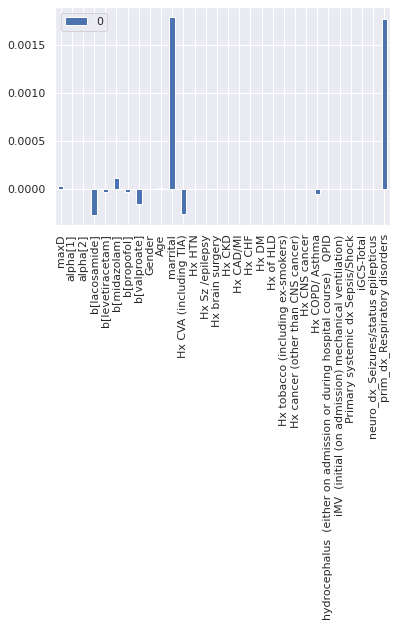

In [255]:
pd.DataFrame(model1.coef_,index = combine_df2.iloc[:,2:-1].columns).plot(kind = 'bar')

[Text(279.0, 453.0, 'maxD <= 11.812\nmse = 0.0\nsamples = 1310\nvalue = 0.064'),
 Text(139.5, 271.8, 'Age <= 50.265\nmse = 0.0\nsamples = 434\nvalue = 0.061'),
 Text(69.75, 90.59999999999997, 'mse = 0.0\nsamples = 117\nvalue = 0.055'),
 Text(209.25, 90.59999999999997, 'mse = 0.0\nsamples = 317\nvalue = 0.063'),
 Text(418.5, 271.8, 'alpha[1] <= 0.499\nmse = 0.0\nsamples = 876\nvalue = 0.065'),
 Text(348.75, 90.59999999999997, 'mse = 0.0\nsamples = 875\nvalue = 0.065'),
 Text(488.25, 90.59999999999997, 'mse = -0.0\nsamples = 1\nvalue = -0.006')]

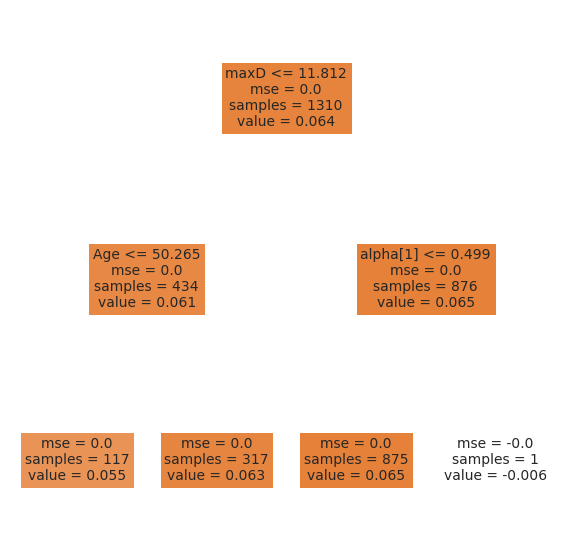

In [251]:
plt.figure(figsize=[10,10])
tree.plot_tree(model2,feature_names=list( combine_df2.iloc[:,2:-1].columns), filled=True)

In [167]:
combine_df2.iloc[:,2:10].columns

Index(['alpha[2]', 'b[lacosamide]', 'b[levetiracetam]', 'b[midazolam]',
       'b[propofol]', 'b[valproate]', 'Gender', 'Age'],
      dtype='object')

In [168]:
#MAX IIC?

In [23]:
import numpy as np
import pandas as pd
import sklearn.tree as tree
import matplotlib.pyplot as plt
import seaborn as sns
import scipy
import scipy.io as sio
import tqdm
import os
import sklearn.ensemble as ensemble
import sklearn.linear_model as lm

data_dir = os.getcwd()

In [24]:
data_dir + 'data_to_fit_CNNIIC_iic_burden_smooth 3.pickle'

'/home/kentaro/Dropbox/step1_output/data_to_fit_CNNIIC_iic_burden_smooth 3.pickle'

In [25]:
import pickle
pickle_off = open(data_dir + 'data_to_fit_CNNIIC_iic_burden_smooth 3.pickle',"rb")
emp = pickle.load(pickle_off)
print(emp)

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



In [26]:
emp['W']

300

In [8]:
n_patients = len(emp['sids'])
max_iic24 = np.ones(n_patients)


for i in range(0,n_patients-1):
    # 143 is nbumber of 10 minute segments in an day 
    max_iic24[i] = np.nanmax(emp['Pobs'][i][0:143])
    
max_iic24 = pd.DataFrame(max_iic24, index = emp['sids'], columns = ['Max IIC 24hr'])
max_iic24.head()

,Max IIC 24hr
sid2,1.000000
sid3,1.000000
sid4,1.000000
sid5,0.412371
sid7,1.000000


In [9]:
Y= pd.read_csv('/home/kentaro/Dropbox/outcomes.csv', index_col = 0)
C = pd.read_csv('/home/kentaro/Dropbox/covariates-full.csv',index_col=0)

thetas = pd.read_csv('/home/kentaro/github/iic_causal_inference/aim1/step6_simulator/results_iic_burden_smooth/params_mean_CNNIIC_iic_burden_smooth_cauchy_expit_lognormal_drugoutside_ARMA2,6_iter1000.csv',index_col=0)
#thetas = pd.read_csv('/Users/harshparikh/Documents/GitHub/iic_causal_inference/aim1/step4_simulator/results/params_CNNIIC_cauchy_expit_lognormal_drugoutside_ARMA2,6_iter1000.csv',index_col=0)
thetas = thetas.fillna(0)
theta_prime = (thetas[['b[lacosamide]', 'b[levetiracetam]', 'b[midazolam]', 'b[pentobarbital]','b[phenobarbital]', 'b[propofol]','b[valproate]']]>0.001).astype(int).rename(columns={name:name+'_given' for name in ['b[lacosamide]', 'b[levetiracetam]', 'b[midazolam]', 'b[pentobarbital]','b[phenobarbital]', 'b[propofol]','b[valproate]']})
thetas = thetas[['alpha0', 'alpha[1]', 'alpha[2]',
        'b[lacosamide]', 'b[levetiracetam]', 'b[midazolam]', 'b[propofol]', 'b[valproate]', 
        'Gender', 'Age',
       'marrital', 'Hx CVA (including TIA)', 'Hx HTN',
       'Hx Sz /epilepsy', 'Hx brain surgery', 'Hx CKD', 'Hx CAD/MI', 'Hx CHF',
       'Hx DM', 'Hx of HLD', 'Hx tobacco (including ex-smokers)',
       'Hx cancer (other than CNS cancer)', 'Hx CNS cancer', 'Hx COPD/ Asthma',
       'hydrocephalus  (either on admission or during hospital course)   QPID',
       'iMV  (initial (on admission) mechanical ventilation)', 'systolic BP',
       'Primary systemic dx Sepsis/Shock', 'iGCS-Total','Worst GCS in 1st 24', 'iGCS actual scores',
       'neuro_dx_Seizures/status epilepticus',
       'prim_dx_Respiratory disorders']].fillna(0)

#remove patients wo/eeg
Y = (Y[['DC MRS (modified ranking scale)']].loc[list(thetas.index)])

#impute one missing value as 4
Y[Y.values == 'na'] = 4
Y = Y.fillna(4)
Y = Y.astype(int)

C = (C.loc[list(thetas.index)])
max_iic24 = max_iic24.loc[list(thetas.index)]

In [10]:
import sys

sys.path.insert(1,'/home/kentaro/github/iic_causal_inference/MALTS')

import pymalts 

In [11]:
combine_df = Y.join(thetas, how='outer')
#combine_df = combine_df.drop('alpha0', axis = 1)
combine_df = max_iic24.join(combine_df, how = 'outer')
combine_df = combine_df.drop('iGCS actual scores', axis = 1)
combine_df.head()

,Max IIC 24hr,DC MRS (modified ranking scale),alpha0,alpha[1],alpha[2],b[lacosamide],b[levetiracetam],b[midazolam],b[propofol],b[valproate],...,Hx CNS cancer,Hx COPD/ Asthma,hydrocephalus (either on admission or during hospital course) QPID,iMV (initial (on admission) mechanical ventilation),systolic BP,Primary systemic dx Sepsis/Shock,iGCS-Total,Worst GCS in 1st 24,neuro_dx_Seizures/status epilepticus,prim_dx_Respiratory disorders
sid2,1.000000,5,0.686272,0.162150,0.418186,0.00000,0.423113,0.0,0.000000,0.0,...,0.0,1.0,1.0,0.0,164.0,0.0,7.0,3.0,0.0,1.0
sid3,1.000000,6,0.630767,0.462997,0.089547,0.00000,1.220218,0.0,0.000000,0.0,...,0.0,0.0,0.0,1.0,146.0,0.0,8.0,8.0,0.0,1.0
sid4,1.000000,6,0.192536,0.155331,0.483151,0.00000,0.045987,0.0,0.046734,0.0,...,0.0,0.0,0.0,0.0,130.0,0.0,4.0,3.0,0.0,1.0
sid5,0.412371,2,-2.058649,-0.186724,0.283235,0.04309,0.000000,0.0,0.169357,0.0,...,0.0,0.0,0.0,1.0,135.0,0.0,6.0,3.0,1.0,0.0
sid7,1.000000,4,-0.936428,0.455809,-0.095871,0.00000,1.984153,0.0,0.013153,0.0,...,0.0,0.0,0.0,1.0,116.0,0.0,3.0,3.0,0.0,0.0


In [12]:
combine_df.columns

Index(['Max IIC 24hr', 'DC MRS (modified ranking scale)', 'alpha0', 'alpha[1]',
       'alpha[2]', 'b[lacosamide]', 'b[levetiracetam]', 'b[midazolam]',
       'b[propofol]', 'b[valproate]', 'Gender', 'Age', 'marrital',
       'Hx CVA (including TIA)', 'Hx HTN', 'Hx Sz /epilepsy',
       'Hx brain surgery', 'Hx CKD', 'Hx CAD/MI', 'Hx CHF', 'Hx DM',
       'Hx of HLD', 'Hx tobacco (including ex-smokers)',
       'Hx cancer (other than CNS cancer)', 'Hx CNS cancer', 'Hx COPD/ Asthma',
       'hydrocephalus  (either on admission or during hospital course)   QPID',
       'iMV  (initial (on admission) mechanical ventilation)', 'systolic BP',
       'Primary systemic dx Sepsis/Shock', 'iGCS-Total', 'Worst GCS in 1st 24',
       'neuro_dx_Seizures/status epilepticus',
       'prim_dx_Respiratory disorders'],
      dtype='object')

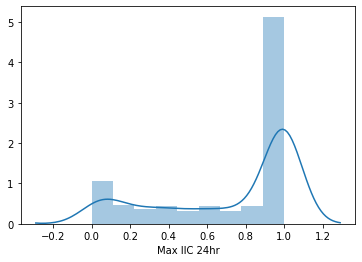

In [13]:
sns.distplot(combine_df['Max IIC 24hr'])

In [122]:
combine_df['Max IIC 24hr Bin'] = combine_df['Max IIC 24hr'] == 1
combine_df = combine_df.drop('Max IIC 24hr', axis = 1)

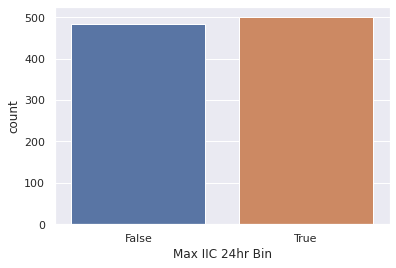

In [123]:
sns.countplot(combine_df['Max IIC 24hr Bin'])

In [124]:
m = pymalts.malts_mf( outcome='DC MRS (modified ranking scale)', treatment='Max IIC 24hr Bin', data=combine_df)# running MALTS with default setting

In [125]:
m.CATE_df

,avg.CATE,std.CATE,DC MRS (modified ranking scale),Max IIC 24hr Bin
sid3,0.077192,0.941434,6.0,1.0
sid4,-0.086369,0.939794,6.0,1.0
sid7,-0.123574,0.939020,4.0,1.0
sid8,-0.114085,0.959481,4.0,1.0
sid12,-0.169094,0.990211,4.0,0.0
...,...,...,...,...
sid1968,-0.105502,0.939020,5.0,1.0
sid1975,-0.375572,1.001753,5.0,0.0
sid1981,0.136640,0.959894,4.0,0.0
sid1983,-0.138719,0.978561,4.0,0.0


In [126]:
ATE = m.CATE_df['avg.CATE'].std()
ATE

0.5258143549517322

In [127]:
ATE = m.CATE_df['avg.CATE'].mean()
ATE

-0.13324002640094842

Text(-4.133240026400949, 0.04, '$\\hat{ATE}$')

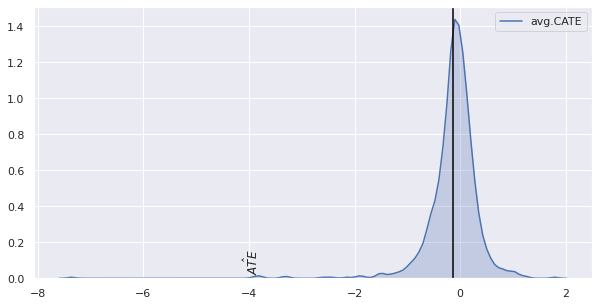

In [128]:
fig = plt.figure(figsize=(10,5))
sns.kdeplot(m.CATE_df['avg.CATE'],shade=True)
plt.axvline(ATE,c='black')
plt.text(ATE-4,0.04,'$\hat{ATE}$',rotation=90)